
## Setup

In [1]:
import json 
def load_params(file_path):
    with open(file_path, "r") as file:
        params = json.load(file)
    return params


params = load_params(
    r"/home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/db/parameters.json"
)
params

{'type': 'rastrigin',
 'CROSSOVER': 0.6,
 'MUTACAO': 0.15,
 'NUM_GENERATIONS': 100,
 'POP_SIZE': 100,
 'IND_SIZE': 10,
 'funcao objetivo': 'rastrigin',
 'RCE_REPOPULATION_GENERATIONS': 50,
 'NUM_VAR_DIFERENTES': 1,
 'PORCENTAGEM': 30,
 'VALOR_LIMITE': 0.5}

In [2]:
import numpy as np
import math
from deap import base, creator, tools
import random
import matplotlib.pyplot as plt
import time
from scipy.optimize import minimize
import json
import pandas as pd
import plotly.graph_objects as go

import plotly.io as pio

pio.renderers.default = "notebook"  # ou 'notebook_connected' para exibir os gráficos inline no Jupyter Notebook

class DataExploration:
    def __init__(self):
        self.fit_array = []

    def default_rastrigin(self, x, y):
        return 20 + x**2 + y**2 - 10 * (np.cos(2 * np.pi * x) + np.cos(2 * np.pi * y))

    def generateSimpleDataset(self):
        # Geração dos dados
        data = pd.DataFrame(
            {"x": np.linspace(-5, 5, 400), "y": np.linspace(-5, 5, 400)}
        )

        # display(data)

        # Generate meshgrid data
        x = np.linspace(-5.15, 5.15, 100)
        y = np.linspace(-5.15, 5.15, 100)
        X, Y = np.meshgrid(x, y)

        # Calculate function values
        # print(X.shape,Y.shape)

        return X, Y

    def plot_Rastrigin_2D(self, X, Y, Z_rastrigin, logbook, best_variables=[]):
        fig = plt.figure(figsize=(18, 10))
        ax1 = fig.add_subplot(231)
        generation = logbook.select("gen")
        statics = self.calculate_stats(logbook)
        line1 = ax1.plot(
            generation, statics["min_fitness"], "*b-", label="Minimum Fitness"
        )
        line2 = ax1.plot(
            generation, statics["avg_fitness"], "+r-", label="Average Fitness"
        )
        line3 = ax1.plot(
            generation, statics["max_fitness"], "og-", label="Maximum Fitness"
        )
        ax1.set_xlabel("Generation")
        ax1.set_ylabel("Fitness")
        ax1.set_title("GERAÇÃO X FITNESS")
        lns = line1 + line2 + line3
        labs = [l.get_label() for l in lns]
        ax1.legend(lns, labs, loc="upper right")

        #! Rastrigin 2D
        # ax2 = fig.add_subplot(232)
        # ax2.contourf(X, Y, Z_rastrigin, levels=50, cmap="viridis")
        # # ax2.plot(best_variables, color='red',)
        # for num in range(len(best_variables)):
        #     var_x = round(best_variables[num])
        #     var_y = best_variables[num]
        #     ax2.scatter(var_x, var_y, color="pink", marker="o", label="best variables")
        # ax2.set_title("Rastrigin Function 2D")
        # ax2.set_xlabel("X")
        # ax2.set_ylabel("Y")

        #! Graficos barras
        ax3 = fig.add_subplot(232)

        if len(generation) > 1:
            best_solutions = [
                min(statics["min_fitness"]) for i in range(len(generation))
            ]
            avg_fitness = statics["avg_fitness"]
            generations = np.arange(1, len(generation) + 1)

            ax3.plot(
                generations,
                avg_fitness,
                marker="o",
                color="r",
                linestyle="--",
                label="Média Fitness por Geração",
            )
            ax3.bar(
                generations,
                statics["min_fitness"],
                color="green",
                label="Melhor Fitness por Geração",
            )

            ax3.set_xlabel("Geração")
            ax3.set_ylabel("Fitness")
            ax3.legend()

        # Rastrigin 3D
        ax5 = fig.add_subplot(233, projection="3d")
        ax5.plot_surface(X, Y, Z_rastrigin, cmap="viridis", edgecolor="none")
        ax5.set_title("Rastrigin Function 3D")
        ax5.set_xlabel("X")
        ax5.set_ylabel("Y")
        ax5.set_zlabel("Z")

        plt.tight_layout()
        plt.show()

    def show_rastrigin_benchmark(self, logbook, best=[]):
        X, Y = self.generateSimpleDataset()

        Z_3D_rastrigin = self.default_rastrigin(X, Y)

        self.plot_Rastrigin_2D(X, Y, Z_3D_rastrigin, logbook, best)

    def statistics_per_generation_df(self, logbook, save = True):
        generations = logbook.select("gen")
        min_fitness = logbook.select("min")
        avg_fitness = logbook.select("avg")
        max_fitness = logbook.select("max")
        std_fitness = logbook.select("std")

        data = {
            "Generation": generations,
            "Min Fitness": min_fitness,
            "Average Fitness": avg_fitness,
            "Max Fitness": max_fitness,
            "Std Fitness": std_fitness,
        }

        df = pd.DataFrame(data)
        display(df)
        if save:
            pasta = "/home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/assets/output"
            df.to_excel(f"{pasta}/statistics_RCE.xlsx")

        return avg_fitness, std_fitness

    def plot_diversidade_genes(self, population):
        print("Plotando diversidade dos genes")
        fig = plt.figure()
        ax = fig.add_subplot(111, projection="3d")

        x_values = [ind[0] for ind in population]  # Retorna a primeira posição do vetor
        y_values = [ind[1] for ind in population]  # Retorna a segunda posição do vetor

        ax.scatter(x_values, y_values, c="b", label="Population")
        ax.set_title("Diversity of genes")
        ax.set_xlabel("X")
        ax.set_ylabel("Y")
        ax.legend()
        plt.show()

    def plot_scatter_turbina(self, turbina, best_variables):
        # Plotar o gráfico de dispersão
        plt.figure(figsize=(10, 6))

        plt.scatter(
            turbina["Curva_Teórica(KWh)"],
            turbina["ActivePower(kW)"],
            label="Dados Reais",
            color="blue",
        )
        plt.plot(
            turbina["Curva_Teórica(KWh)"],
            best_variables * turbina["Curva_Teórica(KWh)"],
            label="Melhor Solução",
            color="red",
        )

        plt.xlabel("Potência Teórica (KWh)")
        plt.ylabel("Potência Ativa (kW)")
        plt.title("Comparação entre Potência Teórica e Potência Ativa")
        plt.legend()
        plt.grid(True)
        plt.show()

    def displayDataFrameInfo(self, array, text):
        # Criar DataFrame com as melhores soluções
        best_df = pd.DataFrame(array)
        self.cout(text)
        display(best_df)
        return best_df

    def show_conjuntoElite(self, pop):
        print("\n\n-->Conjunto Elite:", pop)
        best_df = pd.DataFrame(pop)
        display(best_df.sort_values(by="Fitness", ascending=False))

    def calculate_stats(self, logbook):

        fit_avg = logbook.select("avg")
        fit_std = logbook.select("std")
        fit_min = logbook.select("min")
        fit_max = logbook.select("max")

        self.fit_array.append(fit_min)
        self.fit_array.append(fit_avg)
        self.fit_array.append(fit_max)
        self.fit_array.append(fit_std)

        return {
            "min_fitness": fit_min,
            "max_fitness": fit_max,
            "avg_fitness": fit_avg,
            "std_fitness": fit_std,
        }

    def rastrigin(self, x):
        A = 10
        return A * len(x) + sum(
            [(x[i] ** 2 - A * np.cos(2 * math.pi * x[i])) for i in range(len(x))]
        )

    def cout(self, msg):
        print(
            "=========================================================================================="
        )
        print(msg)
        print(
            "=========================================================================================="
        )

    def reultsInfo(self, logbook):
        num_generations = logbook.select("gen")
        statics = self.calculate_stats(logbook)

        return {"Generations":num_generations},statics

    def visualize(self, logbook, pop, problem_type="minimaze", repopulation=True):
        generation = logbook.select("gen")
        statics = self.calculate_stats(logbook)

        if problem_type == "maximize":
            # Se o problema for de maximização, inverter os valores de fitness para exibir corretamente o gráfico
            statics = {
                key: [-value for value in values] for key, values in statics.items()
            }

        if repopulation:
            best_solution_index = statics["min_fitness"].index(
                min(statics["min_fitness"])
            )
            print(best_solution_index)
            best_solution_variables = pop[0]
            best_solution_fitness = statics["min_fitness"][best_solution_index]
        else:
            best_solution_index = statics["min_fitness"].index(
                min(statics["min_fitness"])
            )
            best_solution_variables = logbook.select("min")
            best_solution_fitness = min(statics["min_fitness"])

        # Soluções do problema
        self.cout("Soluções do problema")
        print("\nBest solution generation = ", best_solution_index)
        print("\nBest solution variables =\n", best_solution_variables)
        print("\nBest solution fitness = ", best_solution_fitness)

        try:

            # Encontrar o ótimo global da função Rastrigin usando os valores fornecidos.
            # opt = minimize(
            #     self.rastrigin, best_solution_variables, method="Nelder-Mead", tol=1e-6
            # )
            # print("\nÓtimo global da função Rastrigin = ", opt.fun)
            # print("\nSolução ótima global = ", opt.x)
            # # Comparar as soluções obt
            # print(
            #     "\nPorcentagem de proximidade da solução em relação ao ótimo global = ",
            #     (1 - (best_solution_fitness / opt.fun)) * 100,
            #     "%",
            # )
            # distancia_otimoglobal = abs
            # print(
            #     f"\nDistância da solução em relação ao ótimo global = {distancia_otimoglobal}",
            # )

            # self.grafico_convergencia(generation, statics, repopulation)
            fig = self.graficoRCE(generation, statics, repopulation)
            fig.show()

            return best_solution_index, best_solution_variables, best_solution_fitness
        except:
            print("Erro validation :(")

    def graficoRCE(self, gen, lista, repopulation=False):
        title = f"Estrategia RCE - Crossover: {params["CROSSOVER"]*100}% e Mutação: {params["MUTACAO"]*100}% " if repopulation else "Sem Repopulação RCE"

        fig = go.Figure()
 
        fig.add_trace(
            go.Scatter(
                x=gen,
                y=lista["min_fitness"],
                mode="lines+markers",
                name="Minimum Fitness",
                marker=dict(symbol="star", color="blue"),
                line=dict(color="blue"),
            )
        )

        fig.add_trace(
            go.Scatter(
                x=gen,
                y=lista["avg_fitness"],
                mode="lines+markers",
                name="Average Fitness",
                marker=dict(symbol="cross", color="red"),
                line=dict(color="red"),
            )
        )

        fig.add_trace(
            go.Scatter(
                x=gen,
                y=lista["max_fitness"],
                mode="lines+markers",
                name="Maximum Fitness",
                marker=dict(symbol="circle", color="green"),
                line=dict(color="green"),
            )
        )

        fig.update_layout(
            title=title,
            xaxis_title="Generation",
            yaxis_title="Fitness",
            legend_title="Legend",
            template="plotly_white",
        )

        return fig

    def grafico_convergencia(self, gen, lista, repopulation=False):
        fig, ax1 = plt.subplots()
        if repopulation:
            ax1.set_title("Com Repopulação RCE")
        else: 
            ax1.set_title("Sem Repopulação")

        line1 = ax1.plot(gen, lista["min_fitness"], "*b-", label="Minimum Fitness")
        line2 = ax1.plot(gen, lista["avg_fitness"], "+r-", label="Average Fitness")
        line3 = ax1.plot(gen, lista["max_fitness"], "og-", label="Maximum Fitness")
        ax1.set_xlabel("Generation")
        ax1.set_ylabel("Fitness")
        lns = line1 + line2 + line3
        labs = [l.get_label() for l in lns]
        ax1.legend(lns, labs, loc="upper right")

    def plot_grafico_barras(self, x, y):
        fig, ax = plt.subplots()
        ax.bar(x, y, color="b")
        ax.set_xlabel("Generation")
        ax.set_ylabel("Fitness")
        ax.set_title("Fitness por Geração")
        plt.show()

    def graficoBarrasFitnessGeneration(self, generation, lista, repopulation=False):
        fig, ax = plt.subplots()
        if repopulation:
            ax.set_title("Alg Evolutivo com RCE")
        else:
            ax.set_title("Alg Evolutivo")

        if len(generation) > 1:
            best_solutions = [min(lista["min_fitness"]) for i in range(len(generation))]
            avg_fitness = lista["avg_fitness"]
            generations = np.arange(1, len(generation) + 1)

            ax.plot(
                generations,
                avg_fitness,
                marker="o",
                color="r",
                linestyle="--",
                label="Média Fitness por Geração",
            )
            ax.bar(
                generations,
                lista["min_fitness"],
                color="green",
                label="Melhor Fitness por Geração",
            )

            ax.set_xlabel("Geração")
            ax.set_ylabel("Fitness")
            ax.legend()
            plt.show()

    def plot_diversidade(self, population, repopulation=False):
        fig = plt.figure()
        ax = fig.add_subplot(111, projection="3d")

        if repopulation:
            ax.set_title("Com Repopulação")
        else:
            ax.set_title("Sem Repopulação")

        x_values = [ind[0] for ind in population]
        y_values = [ind[1] for ind in population]
        z_values = [ind[2] for ind in population]

        ax.scatter(x_values, y_values, z_values, c="b", label="Population")

        ax.set_xlabel("X")
        ax.set_ylabel("Y")
        ax.set_zlabel("Z")
        ax.legend()
        ax.grid(True)

        plt.show()

In [3]:
import numpy as np
import math
from deap import base, creator, tools
import random
import matplotlib.pyplot as plt
import time
from scipy.optimize import minimize
import json
import pandas as pd


class Setup:
    def __init__(self, params, dadosEntrada=None):

        #! Parametros JSON
        self.params = params
        self.DADOS_ENTRADA = dadosEntrada  # Dados da entrada do usuario

        self.CXPB = params["CROSSOVER"]
        self.MUTPB = params["MUTACAO"]
        self.NGEN = params["NUM_GENERATIONS"]
        self.POP_SIZE = params["POP_SIZE"]
        self.SIZE_INDIVIDUAL = params["IND_SIZE"]
        self.TAXA_GENERATION = params["RCE_REPOPULATION_GENERATIONS"]
        self.CROSSOVER, self.MUTACAO, self.NUM_GENERATIONS, self.POPULATION_SIZE = (
            self.CXPB,
            self.MUTPB,
            self.NGEN,
            self.POP_SIZE,
        )

        self.NUM_VAR_DIF = params["NUM_VAR_DIFERENTES"]
        self.porcentagem = params["PORCENTAGEM"]
        self.delta = params["VALOR_LIMITE"]

        #! Parâmetros do algoritmo de Rastrigin
        self.evaluations = 0
        self.num_repopulation = int(self.NUM_GENERATIONS * (self.TAXA_GENERATION/100))
        self.type = params["type"].lower()
        if self.type == "maximize":
            print("Método escolhido: Maximizar")
            creator.create("Fitness", base.Fitness, weights=(1.0,))
        else:
            print("Método escolhido: Minimizar")
            creator.create("Fitness", base.Fitness, weights=(-1.0,))

        self.dataset = {}

        #!Criando individuo pelo deap com seus atributos
        self.toolbox = base.Toolbox()

        # Função de fitness de minimização
        creator.create("FitnessMin", base.Fitness, weights=(-1.0,))

        # parâmetros
        creator.create(
            "Individual", list, fitness=creator.FitnessMin, rce=str, index=int
        )

        # Variavel de decisão
        self.toolbox.register("attribute", random.uniform, -5.12, 5.12)

        # registrando os individuos
        self.toolbox.register(
            "individual",
            tools.initRepeat,
            creator.Individual,
            self.toolbox.attribute,
            n=self.SIZE_INDIVIDUAL,
        )

        #! individuos com dados de entrada
        if self.DADOS_ENTRADA:
            creator.create(
                "FrameworkIndividual",
                list,
                fitness=creator.FitnessMin,
                tipo=self.DADOS_ENTRADA[0],
                rce=str,
            )
            self.toolbox.register(
                "varDecision",
                random.uniform,
                self.DADOS_ENTRADA[2][0],
                self.DADOS_ENTRADA[2][1],
            )
            self.toolbox.register(
                "newIndividual",
                tools.initRepeat,
                creator.FrameworkIndividual,
                self.toolbox.varDecision,
                n=self.DADOS_ENTRADA[1],
            )

            self.toolbox.register(
                "FrameworkPopulation",
                tools.initRepeat,
                list,
                self.toolbox.newIndividual,
            )

        #! paramentos evolutivos
        self.toolbox.register(
            "population", tools.initRepeat, list, self.toolbox.individual
        )

        self.toolbox.register("mate", tools.cxTwoPoint)
        self.toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=1, indpb=0.1)
        self.toolbox.register("select", tools.selTournament, tournsize=3)
        self.toolbox.register("evaluate", self.evaluate_fitness)

    def evaluate_fitness(self, individual):

        # print("Função escolhida:",self.type)

        if self.type == "rastrigin":
            result = minimize(
                self.rastrigin, x0=np.zeros(self.SIZE_INDIVIDUAL), method="BFGS"
            )
            fitness_value = result.fun

        if self.type == "test_02":
            fitness_value = self.rosenbrock(individual)

        if self.type == "esfera":
            fitness_value = individual[0] ** 2 + individual[1] ** 2

        return fitness_value

    def gerarDataset(self, excel):
        df = pd.read_excel(excel)
        print(df.columns)
        self.dataset = {
            "CXPB": self.CROSSOVER,
            "TAXA_MUTACAO": self.MUTACAO,
            "NUM_GEN": self.NUM_GENERATIONS,
            "POP_SIZE": self.POPULATION_SIZE,
            "IND_SIZE": self.SIZE_INDIVIDUAL,
            "evaluations": self.evaluations,
            "NUM_REPOPULATION": self.num_repopulation,
        }

    def rastrigin(self, individual):
        self.evaluations += 1
        rastrigin = 10 * self.SIZE_INDIVIDUAL
        for i in range(self.SIZE_INDIVIDUAL):
            rastrigin += individual[i] * individual[i] - 10 * (
                math.cos(2 * np.pi * individual[i])
            )
        return rastrigin

    def rastrigin_decisionVariables(self, individual, decision_variables):
        self.evaluations += 1
        rastrigin = 10 * len(decision_variables)
        for i in range(len(decision_variables)):
            rastrigin += individual[i] * individual[i] - 10 * (
                math.cos(2 * np.pi * individual[i])
            )
        return rastrigin

    def rosenbrock(self, x):

        var = np.array(x)

        return np.sum(100 * (var[1:] - var[:-1] ** 2) ** 2 + (1 - var[:-1]) ** 2)

    def globalSolutions(self):
        n_dimensions = 2

        try:
            rastrigin_result = minimize(
                self.rastrigin, x0=np.zeros(n_dimensions), method="BFGS"
            )
            rastrigin_minimum = rastrigin_result.fun
            rastrigin_solution = rastrigin_result.x

            rosenbrock_result = minimize(
                self.rosenbrock, x0=np.zeros(n_dimensions), method="BFGS"
            )
            rosenbrock_minimum = rosenbrock_result.fun
            rosenbrock_solution = rosenbrock_result.x

        except Exception as e:
            print("Erro ao tentar encontrar o ótimo global das funções: ", e)

        print("\n\nÓtimo global da função Rastrigin: ", rastrigin_minimum)
        print("Solução: ", rastrigin_solution)
        print()
        print("Ótimo global da função Rosenbrock: ", rosenbrock_minimum)
        print("Solução: ", rosenbrock_solution)

## RCE EVOLUTION

In [4]:
import numpy as np
import math
from deap import base, creator, tools
import random
import matplotlib.pyplot as plt
import time
from scipy.optimize import minimize
import json
import pandas as pd
import numpy as np
import math
from deap import base, creator, tools
import random
import matplotlib.pyplot as plt
import time
from scipy.optimize import minimize
import json
import pandas as pd


class AlgoritimoEvolutivoRCE:
    def __init__(self, setup):
        self.setup = setup
        self.stats = tools.Statistics(key=lambda ind: ind.fitness.values)
        self.stats.register("avg", np.mean)
        self.stats.register("std", np.std)
        self.stats.register("min", np.min)
        self.stats.register("max", np.max)

        self.logbook = tools.Logbook()
        self.hof = tools.HallOfFame(1)
        self.POPULATION = self.setup.toolbox.population(n=self.setup.POP_SIZE)
        self.hof.update(self.POPULATION)

        if self.setup.DADOS_ENTRADA:
            self.POP_OPTIMIZATION = self.setup.toolbox.population(n=self.setup.POP_SIZE)

        self.pop_RCE = []
        self.best_solutions_array = []
        self.best_individual_array = []
        self.allIndividualValuesArray = []
        self.data = {}
        self.repopulation_counter = 0
        self.allFitnessValues = {}
        self.validateCounter = 0
        self.CONJUNTO_ELITE_RCE = set()

    def registrarDados(self, generation):

        # Registrar estatísticas e melhores soluções
        for ind in self.POPULATION:
            avg_fitness_per_generation = np.mean(ind.fitness.values)
            std_deviation = np.std(ind.fitness.values)

        #! PEgandos os dados e colocando no df
        self.data = {
            "Generations": generation + 2,
            "Variaveis de Decisão": self.hof[0],
            "Evaluations": self.setup.evaluations,
            "Ind Valido": self.hof[0].fitness.valid,
            "Best Fitness": self.hof[0].fitness.values,
            "Media": avg_fitness_per_generation,
            "Desvio Padrao": std_deviation,
        }

        self.best_individual_array.append(self.data)

        self.visualizarPopAtual(generation, [avg_fitness_per_generation, std_deviation])

    def checkClonesInPop(self, ind, new_pop):
        is_clone = False
        for other_ind in new_pop:
            if (
                ind == other_ind
                and sum(ind) == sum(other_ind)
                and ind.index != other_ind.index
            ):
                is_clone = True
                break
        return is_clone

    def generateInfoIndividual(self, new_pop, generation):
        ind_array = []

        for i, ind in enumerate(new_pop):
            # print(f"Index[{ind.index}] - ind_variables {ind} \n Fitness = {ind.fitness.values} ")

            ind.index = i

            ind_info = {
                "Generations": generation,
                "index": ind.index,
                "Variaveis de Decisão": ind,
                "Fitness": ind.fitness.values[0],
                "RCE": ind.rce,
                "Diversidade": np.sum(ind),
            }

            # Adicionar a informação de clone ao dicionário
            # is_clone = self.checkClonesInPop(ind, new_pop)
            # ind_info["CLONE"] = "SIM" if is_clone else "NAO"

            ind_array.append(ind_info)

        return ind_array

    def show_ind_df(self, array, text, save = False):
        df = pd.DataFrame(array)
        print(text)
        display(df.head(50))
        diretorio = "/home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/assets/output"
        if save:
            df.to_csv(f"{diretorio}/pop_final.xlsx")

        # contar quantos SIM na coluna CLONE se a coluna RCE for SIM
        # display(df[df["RCE"] != ""].value_counts())

    def criterio1(self, new_pop, porcentagem, k=30):
        """Seleciona os candidatos ao conjunto elite com base nas diferenças percentuais de aptidão."""
        self.cout(f"CRITÉRIO 1 RCE - Selecionando candidatos ao conjunto elite")
        elite_individuals = []

        # Ordenar a população em ordem crescente de aptidão e selecionar os k primeiros indivíduos
        sorted_population = sorted(self.POPULATION, key=lambda x: x.fitness.values[0])

        # Obter o melhor indivíduo (HOF) da população
        best_ind = new_pop[0]
        best_fitness = best_ind.fitness.values[0]
        max_difference = (1 + porcentagem) * best_fitness

        # Selecionar com as menores diferenças percentuais
        for ind in sorted_population:
            if ind.fitness.values[0] <= max_difference:
                elite_individuals.append(ind)
            else:
                break  # Parar a seleção quando a diferença percentual for maior que o limite

        # Colocando na pop aleatória
        print(
            f"Calculando percentual de {porcentagem*100}% com base no melhor fitness = {best_fitness} e pegando os {len(elite_individuals)} melhores.\n Porcentagem de {best_fitness} = {max_difference} "
        )
        for i, ind in enumerate(elite_individuals):
            new_pop[i] = self.setup.toolbox.clone(ind)
            new_pop[i].rce = "SIM_1"

        return elite_individuals

    def criterio2_alternative(self, ind_selecionados, delta=6):
        """Comparar as variáveis de decisão de cada indivíduo e verificar se existem diferenças superiores a 'delta'."""
        self.cout(
            f"CRITÉRIO 2 - Comparar as variáveis de decisão de cada indivíduo e verificar valores superiores a 'delta' = {delta}."
        )
        self.CONJUNTO_ELITE_RCE.clear()

        for i in range(len(ind_selecionados)):

            #    todo   Calcular Diff - diferença entre as variáveis de indivíduo e individuo lista

            diff = np.array(ind_selecionados[i]) - np.array(ind_selecionados[0])

            # todo retornar true ou false caso ind seja diferente para colocar no array correto
            if sum(diff) > delta:  # ind diferente
                if (ind_selecionados[i] not in self.pop_RCE) and (
                    ind_selecionados[i] not in ind_selecionados[0]
                ):
                    self.pop_RCE.append(self.POP_OPTIMIZATION[i])
                    self.CONJUNTO_ELITE_RCE.add(tuple(self.POP_OPTIMIZATION[i]))
                    ##print("Delta= ", sum(diff))

        if not self.pop_RCE:
            print("Nenhum indivíduo atende aos critérios. :( ")

        print("Tamanho Elite = ", len(self.pop_RCE))
        print("Tamanho Elite = ", len(self.CONJUNTO_ELITE_RCE))

        return self.pop_RCE

    def newCriterio(self, population):
        self.CONJUNTO_ELITE_RCE.clear()
        self.pop_RCE = []

        def criterio1_reduzido(population):
            #! critério 1 e obtém os N melhores com 30% do valor do melhor fitness

            best_ind = self.elitismoSimples(population)[0]
            best_fitness = best_ind.fitness.values[0]
            max_difference = (1 + self.setup.porcentagem) * best_fitness
            print(
                f"Fitness ({self.setup.porcentagem * 100})% = {round(max_difference,3)}"
            )
            return max_difference, best_ind

        self.cout(
            "Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos"
        )
        max_difference, best_ind = criterio1_reduzido(population)
        self.pop_RCE.append(best_ind)

        def calculaDiff(ind, lista):
            count = 0

            # calcula a diferença entre o ind selecionado e o pessoal do RCE
            for i in range(0, len(lista)):
                diff = abs(np.array(ind) - np.array(lista[i]))
                array = list(diff)

                # pegando quantos valores nao sao nulos  -> caso tenha valor limite
                if sum(array) > 0.0:
                    for value in array:
                        if value > self.setup.NUM_VAR_DIF:
                            count += 1

                    # se o contador for maior que delta
                    if count >= self.setup.delta:
                        # print("\nArray diferente")

                        # print(" diff", array)

                        # print("Var decision diferentes = ", count)
                        return True

                    else:
                        return False  # sem diversidade suficiente
                else:
                    return False  # clone: Variaveis iguais

        self.cout(f"New - CRITÉRIO 2 RCE ")
        for ind in population:
            # criterio 1
            if ind.fitness.values[0] <= max_difference:
                # criterio 2
                diferente = calculaDiff(ind, self.pop_RCE)  # delta como valor limite
                if diferente:
                    if ind not in self.pop_RCE:
                        self.pop_RCE.append(ind)
                        self.CONJUNTO_ELITE_RCE.add(tuple(ind))

        if len(self.pop_RCE) == 1:
            print("Nenhum indivíduo atende aos critérios. :( ")

        print("\nTamanho Elite = ", len(self.pop_RCE))
        print("Tamanho Elite = ", len(self.CONJUNTO_ELITE_RCE))

        return self.pop_RCE

    def aplicar_RCE(self, generation, current_population):

        #! a - Cria uma pop aleatória (eliminando a pop aleatória criada na execução anterior do RCE)
        new_pop = self.setup.toolbox.population(
            n=self.setup.POP_SIZE
        )  # retorna uma pop com lista de individuos de var de decisão

        # Avaliar o fitness da população atual
        self.avaliarFitnessIndividuos(current_population)
        self.calculateFitnessGeneration(current_population)

        #! b - Coloca o elite hof da pop anterior  no topo (0)
        pop = self.elitismoSimples(current_population)
        print(
            f"Elitismo HOF Index[{pop[0].index}] {pop[0]} \n Fitness = {pop[0].fitness.values} | Diversidade = {sum(pop[0])}"
        )  # pop[0] é o melhor individuo HOF
        new_pop[0] = self.setup.toolbox.clone(pop[0])

        #! Critério 2 usando este array e vai colocando os indivíduos selecionados pelo critério 2 na pop aleatória (passo a)
        ind_diferentes_var = self.newCriterio(
            current_population,
        )

        # cOLOCANDO ATRIBUTOS
        for i, ind in enumerate(ind_diferentes_var, start=0):
            new_pop[0].rce = "HOF"
            if i > 0:
                new_pop[i] = self.setup.toolbox.clone(ind)
                new_pop[i].rce = "SIM"

        #! Criterio 3 retorna pop aleatória modificada (com hof + rce + Aleatorio)
        self.calculateFitnessGeneration(new_pop)
        self.cout(f"CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] ")
        conjunto_elite = self.generateInfoIndividual(new_pop, generation)
        self.show_ind_df(conjunto_elite, "Individuos da nova população aleatória")
        return new_pop

    def elitismoSimples(self, pop):
        self.hof.update(pop)
        pop[0] = self.setup.toolbox.clone(self.hof[0])
        return pop

    def criterio2(self, elite_individuals, delta):
        """Comparar as variáveis de decisão de cada indivíduo e verificar se existem diferenças superiores a 'delta'."""
        self.cout(
            f"CRITÉRIO 2 - Comparar as variáveis de decisão de cada indivíduo e verificar se existem diferenças superiores a 'delta' = {delta}."
        )
        self.pop_RCE = []
        self.CONJUNTO_ELITE_RCE.clear()

        for i in range(len(elite_individuals)):
            current_individual = elite_individuals[i]
            is_diferente = False

            for j in range(i + 1, len(elite_individuals)):
                other_individual = elite_individuals[j]
                diff_counter = 0

                for var_index in range(len(current_individual)):
                    current_var = current_individual[var_index]
                    other_var = other_individual[var_index]

                    if abs(current_var - other_var) > delta:
                        # print(abs(current_var - other_var))
                        diff_counter += 1

                if diff_counter >= 1:
                    is_diferente = True

            if is_diferente:
                # print(f"Indivíduo do tipo {type(current_individual)} VAR({current_individual})\n diferente! adicionado à nova população.")
                self.pop_RCE.append(current_individual)
                self.CONJUNTO_ELITE_RCE.add(tuple(current_individual))

        if not self.pop_RCE:
            print("Nenhum indivíduo atende aos critérios. :( ")

        print("Tamanho Elite = ", len(self.pop_RCE))
        return self.pop_RCE

    def avaliarFitnessIndividuos(self, pop):
        """Avaliar o fitness dos indivíduos da população atual."""
        fitnesses = map(self.setup.toolbox.evaluate, pop)
        for ind, fit in zip(pop, fitnesses):
            if ind.fitness.values:
                ind.fitness.values = [fit]

    def calculateFitnessGeneration(self, new_pop):
        # Calculando o fitness para geração
        for ind in new_pop:
            if not ind.fitness.valid:
                fitness_value = self.setup.toolbox.evaluate(ind)
                ind.fitness.values = (fitness_value,)

    def checkDecisionVariablesAndFitnessFunction(
        self, decision_variables, fitness_function
    ):

        # Verificar se as variáveis de decisão e a função de fitness foram fornecidas
        if decision_variables is None and fitness_function is None:
            # Gerar variáveis de decisão aleatórias para os indivíduos
            decision_variables = [
                random.random() for _ in range(self.setup.SIZE_INDIVIDUAL)
            ]

            # Definir a função de fitness padrão como a função Rastrigin
            fitness_function = self.setup.rastrigin_decisionVariables

        if decision_variables is None or fitness_function is None:
            if not hasattr(self, "decision_variables") or not hasattr(
                self, "fitness_function"
            ):
                raise ValueError(
                    "Variáveis de decisão e função de fitness não definidas. Use set_decision_variables_and_fitness_function primeiro."
                )
        else:
            self.decision_variables = decision_variables
            self.fitness_function = fitness_function

            # Definir a função de fitness com base na função fornecida
            def fitness_func(individual):
                return self.fitness_function(individual, self.decision_variables)

            # Registrar a função de fitness no toolbox
            self.setup.toolbox.register("evaluate", fitness_func)

    #! Main LOOP
    def run(self, RCE=False, decision_variables=None, fitness_function=None, num_pop=0):

        if self.setup.DADOS_ENTRADA:
            population = [self.POPULATION, self.POP_OPTIMIZATION]
        else:
            population = [self.POPULATION]

        # Avaliar o fitness da população inicial
        self.avaliarFitnessIndividuos(population[num_pop])

        # Selecionando as variaveis de decisao e afuncao objeti
        self.checkDecisionVariablesAndFitnessFunction(
            decision_variables, fitness_function
        )

        #! Loop principal através das gerações
        for current_generation in range(self.setup.NGEN):

            # Selecionar os indivíduos para reprodução
            offspring = self.setup.toolbox.select(
                population[num_pop], k=len(population[num_pop])
            )

            # Clone the selected individuals
            offspring = [self.setup.toolbox.clone(ind) for ind in offspring]

            # Aplicar crossover
            for child1, child2 in zip(offspring[::2], offspring[1::2]):
                if random.random() < self.setup.CXPB:
                    self.setup.toolbox.mate(child1, child2)
                    del child1.fitness.values
                    del child2.fitness.values

            # Aplicar mutação
            for mutant in offspring:
                if random.random() < self.setup.MUTPB:
                    self.setup.toolbox.mutate(mutant)
                    del mutant.fitness.values

            #  Avaliar o fitness dos novos indivíduos
            invalid_ind = [ind for ind in offspring if not ind.fitness.valid]
            fitnesses = map(self.setup.toolbox.evaluate, invalid_ind)
            for ind, fit in zip(invalid_ind, fitnesses):
                ind.fitness.values = [fit]

            #! Aplicar RCE
            if RCE and ((current_generation + 1) % self.setup.num_repopulation == 0):
                print("")
                self.cout(
                    f"RCE being applied! - Generation = {current_generation + 1} ",
                )
                #! f - copia pop aleatória modificada retornada para pop atual
                new_population = self.aplicar_RCE(
                    current_generation + 1, population[num_pop]
                )
                # print("\nPopulação gerada pelo RCE\n", population[num_pop])
                population[num_pop][:] = new_population
            else:
                population[num_pop][:] = offspring

            # Registrar estatísticas no logbook
            self.elitismoSimples(population[num_pop])
            self.registrarDados(current_generation)
            record = self.stats.compile(population[num_pop])
            self.logbook.record(gen=current_generation, **record)

        # Retornar população final, logbook e elite
        return population[num_pop], self.logbook, self.hof[0]

    def visualizarPopAtual(self, geracaoAtual, stats):

        for i in range(len(self.POPULATION)):
            datasetIndividuals = {
                "Generations": geracaoAtual + 1,
                "index": i,
                "Variaveis de Decisão": self.POPULATION[i],
                "Fitness": self.POPULATION[i].fitness.values,
                "Media": stats[0],
                "Desvio Padrao": stats[1],
                "RCE": " - ",
            }
            self.allIndividualValuesArray.append(datasetIndividuals)

    def cout(self, msg):
        print(
            "\n=========================================================================================================="
        )
        print("\t", msg)
        print(
            "==========================================================================================================\n"
        )


def load_params(file_path):
    with open(file_path, "r") as file:
        params = json.load(file)
    return params

## exemplo

In [5]:
def load_params(file_path):
    with open(file_path, "r") as file:
        params = json.load(file)
    return params


params = load_params(
    r"/home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/db/parameters.json"
)

## problema da mochila - combinatria do tipo binario

# SA -> https://github.com/brunodeathayde/SA_TSP/blob/main/main_SA.py

# evolution
prob_dict = {
    "tipo": "binario",
    "num_var": 8,
    "lim_var": [1, 12],
    "fitness": 0,
}

# problema
multa = 1000
pop = 10
capacidade_mochila = 15
quantidade_itens = [1, 8, 3, 12, 7, 5, 6, 3]
lucro = [2, 5, 3, 10, 8, 1, 3, 4]
fitness = lambda x: (capacidade_mochila - sum(quantidade_itens[x])) * multa * sum(lucro)

# print(fitness(2))

In [6]:
#! Carregar os dados
turbina = pd.read_csv(
    r"/home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/assets/datasets/T1.csv"
)
turbina.columns = [
    "Data/hora",
    "ActivePower(kW)",
    "WindSpeed(m/s)",
    "Curva_Teórica(KWh)",
    "Direção do Vento",
]
display(turbina.head())

X = turbina[["WindSpeed(m/s)"]].values
y = turbina[["ActivePower(kW)"]].values
data_hora = turbina[["Data/hora"]].values
curva = turbina[["Curva_Teórica(KWh)"]].values
vento = turbina[["Direção do Vento"]].values

print(X.shape, y.shape)


def rastrigin_decisionVariables(individual, decision_variables):
    rastrigin = 10 * len(decision_variables)
    for i in range(len(decision_variables)):
        rastrigin += individual[i] * individual[i] - 10 * (
            math.cos(2 * np.pi * individual[i])
        )
    return rastrigin

,Data/hora,ActivePower(kW),WindSpeed(m/s),Curva_Teórica(KWh),Direção do Vento
0,01 01 2018 00:00,380.047791,5.311336,416.328908,259.994904
1,01 01 2018 00:10,453.769196,5.672167,519.917511,268.641113
2,01 01 2018 00:20,306.376587,5.216037,390.900016,272.564789
3,01 01 2018 00:30,419.645905,5.659674,516.127569,271.258087
4,01 01 2018 00:40,380.650696,5.577941,491.702972,265.674286


(50530, 1) (50530, 1)


## Main

Método escolhido: Minimizar


	 RCE being applied! - Generation = 50 

Elitismo HOF Index[0] [-0.01613679080862529, -0.05430008321844926, 0.5230689478585695, 3.7614424635413313, 1.2281332574972827, -2.7414932093708204, 1.8041245903218384, -1.513472800981615, 0.8924820448408024, -1.9694395331287717] 
 Fitness = (0.630951630901496,) | Diversidade = 1.9144088865515427

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 19.56

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  75
Tamanho Elite =  74

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,50,0,"[-0.01613679080862529, -0.05430008321844926, 0...",0.630952,HOF,1.914409
1,50,1,"[-0.01613679080862529, -0.05430008321844926, 1...",0.630952,SIM,0.591682
2,50,2,"[-0.01613679080862529, -0.05430008321844926, 2...",0.630952,SIM,0.293698
3,50,3,"[-0.01613679080862529, -0.05430008321844926, -...",0.630952,SIM,7.040922
4,50,4,"[-0.01613679080862529, -0.05430008321844926, 0...",0.630952,SIM,-0.488324
5,50,5,"[-0.01613679080862529, -0.05430008321844926, -...",0.630952,SIM,-7.600786
6,50,6,"[-0.01613679080862529, -0.05430008321844926, -...",0.630952,SIM,-3.780572
7,50,7,"[-0.01613679080862529, -0.05430008321844926, 0...",0.630952,SIM,-6.358666
8,50,8,"[-0.01613679080862529, -0.05430008321844926, -...",0.630952,SIM,0.948872
9,50,9,"[-0.01613679080862529, -0.05430008321844926, -...",0.630952,SIM,-4.646219




	 RCE being applied! - Generation = 100 

Elitismo HOF Index[0] [-0.011716023331460903, -0.001481290580453499, 0.5230689478585695, 2.9044227466532524, 1.2281332574972827, -2.7414932093708204, -4.611882775969709, -2.1108446930822726, -1.1189497523244853, -1.9694395331287717] 
 Fitness = (0.027655409792608054,) | Diversidade = -7.9101823257788695

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 0.857

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  29
Tamanho Elite =  28

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,100,0,"[-0.011716023331460903, -0.001481290580453499,...",0.027655,HOF,-7.910182
1,100,1,"[-0.011716023331460903, -0.001481290580453499,...",0.027655,SIM,-6.121046
2,100,2,"[-0.011716023331460903, -0.001481290580453499,...",0.027655,SIM,-7.402985
3,100,3,"[-0.011716023331460903, -0.001481290580453499,...",0.027655,SIM,-5.989122
4,100,4,"[-0.011716023331460903, -0.001481290580453499,...",0.027655,SIM,-6.534823
5,100,5,"[-0.011716023331460903, -0.001481290580453499,...",0.027655,SIM,-5.078335
6,100,6,"[-0.011716023331460903, -0.001481290580453499,...",0.027655,SIM,-6.442887
7,100,7,"[-0.011716023331460903, -0.001481290580453499,...",0.027655,SIM,-6.902740
8,100,8,"[-0.011716023331460903, -0.001481290580453499,...",0.027655,SIM,-6.456383
9,100,9,"[-0.011716023331460903, -0.001481290580453499,...",0.027655,SIM,-9.368544




Evolução concluída  - 100%

	 VISUALIZANDO OS RESULTADOS



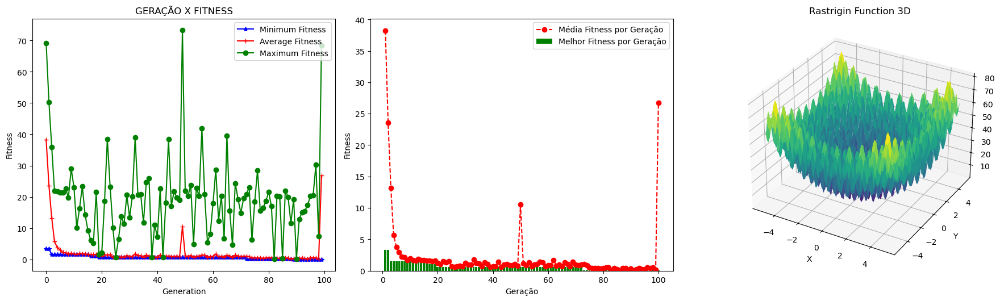

92
Soluções do problema

Best solution generation =  92

Best solution variables =
 [-0.011716023331460903, -0.001481290580453499, 0.5230689478585695, 2.9044227466532524, 1.2281332574972827, -2.7414932093708204, -4.611882775969709, -2.1108446930822726, -1.1189497523244853, -1.9694395331287717]

Best solution fitness =  0.027655409792608054


,Generation,Min Fitness,Average Fitness,Max Fitness,Std Fitness
0,0,3.331567,38.242924,69.118481,16.025413
1,1,3.331567,23.602676,50.290599,11.611848
2,2,1.497802,13.212068,35.833213,9.187569
3,3,1.497802,5.694270,21.888465,5.125374
4,4,1.497802,3.792755,21.700437,3.217705
...,...,...,...,...,...
95,95,0.027655,0.535157,20.269536,2.873200
96,96,0.027655,0.433483,20.409240,2.741730
97,97,0.027655,0.535035,30.283507,3.341433
98,98,0.027655,0.199322,7.354081,1.009581


{'Resultado': 1, 'Best Fitness Value': np.float64(0.027655409792608054), 'Media Fitness': np.float64(26.73463518756192), 'Desvio Padrão': np.float64(21.244857938054864), 'Variaveis Decisão': [[-0.012, -0.001, 0.523, 2.904, 1.228, -2.741, -4.612, -2.111, -1.119, -1.969]], 'Solution Generation': 92, 'Crossover': 0.6, 'Mutação do Individuo': 0.15, 'Percentual apply rce': 30, 'Num Var Diferença': 1, 'Delta': 0.5, 'RCE Num Generations': 50, 'otimização': 'rastrigin'}


,Resultado,Best Fitness Value,Media Fitness,Desvio Padrão,Variaveis Decisão,Solution Generation,Crossover,Mutação do Individuo,Percentual apply rce,Num Var Diferença,Delta,RCE Num Generations,otimização
0,1,0.027655,26.734635,21.244858,"[-0.012, -0.001, 0.523, 2.904, 1.228, -2.741, ...",92,0.6,0.15,30,1,0.5,50,rastrigin


Arquivo criado ! /home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/assets/output/results/resultado_RCE_1.xlsx
Método escolhido: Minimizar


/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Fitness' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.





	 RCE being applied! - Generation = 50 

Elitismo HOF Index[0] [0.030115667159162918, 0.0023714445028132636, 4.272452390269968, -4.090214111705052, -1.5151299111326044, 4.058667483748201, -1.9414869367509562, -1.7590277399318213, -0.652926832435627, -4.748067857234217] 
 Fitness = (0.18051453594577538,) | Diversidade = -6.343246403510133

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 5.596

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  57
Tamanho Elite =  56

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,50,0,"[0.030115667159162918, 0.0023714445028132636, ...",0.180515,HOF,-6.343246
1,50,1,"[0.030115667159162918, 0.007591558859387011, 5...",0.190830,SIM,7.204501
2,50,2,"[0.030115667159162918, 0.007591558859387011, 3...",0.190830,SIM,12.122891
3,50,3,"[0.030115667159162918, 0.007591558859387011, 5...",0.190830,SIM,1.600330
4,50,4,"[0.030115667159162918, 0.007591558859387011, 3...",0.190830,SIM,-2.622729
5,50,5,"[0.030115667159162918, 0.007591558859387011, 5...",0.190830,SIM,-5.028645
6,50,6,"[0.030115667159162918, 0.0023714445028132636, ...",0.180515,SIM,-6.828691
7,50,7,"[0.030115667159162918, 0.007591558859387011, 5...",0.190830,SIM,-1.328250
8,50,8,"[0.030115667159162918, 0.007591558859387011, 6...",0.190830,SIM,3.739322
9,50,9,"[0.030115667159162918, 0.007591558859387011, 4...",0.190830,SIM,-2.121791




	 RCE being applied! - Generation = 100 

Elitismo HOF Index[0] [0.030115667159162918, 0.0023714445028132636, 4.272452390269968, -4.090214111705052, -1.5151299111326044, 4.058667483748201, -1.9414869367509562, -1.7590277399318213, -0.652926832435627, -4.748067857234217] 
 Fitness = (0.18051453594577538,) | Diversidade = -6.343246403510133

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 5.596

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  65
Tamanho Elite =  64

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,100,0,"[0.030115667159162918, 0.0023714445028132636, ...",0.180515,HOF,-6.343246
1,100,1,"[0.030115667159162918, 0.0023714445028132636, ...",0.180515,SIM,-5.807004
2,100,2,"[0.030115667159162918, 0.0023714445028132636, ...",0.180515,SIM,-5.821952
3,100,3,"[0.030115667159162918, 0.0023714445028132636, ...",0.180515,SIM,-10.893474
4,100,4,"[0.030115667159162918, 0.0023714445028132636, ...",0.180515,SIM,-7.196051
5,100,5,"[0.030115667159162918, 0.0023714445028132636, ...",0.180515,SIM,-7.895646
6,100,6,"[0.030115667159162918, 0.0023714445028132636, ...",0.180515,SIM,-2.312515
7,100,7,"[0.030115667159162918, 0.0023714445028132636, ...",0.180515,SIM,-4.426382
8,100,8,"[0.030115667159162918, 0.0023714445028132636, ...",0.180515,SIM,-6.642218
9,100,9,"[0.030115667159162918, 0.0023714445028132636, ...",0.180515,SIM,-7.502949




Evolução concluída  - 100%

	 VISUALIZANDO OS RESULTADOS



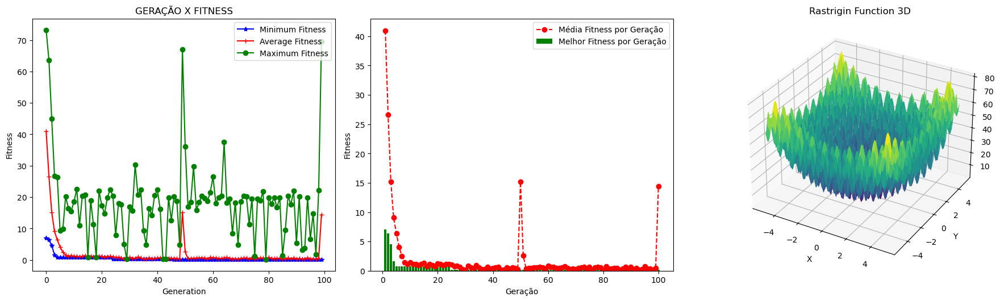

46
Soluções do problema

Best solution generation =  46

Best solution variables =
 [0.030115667159162918, 0.0023714445028132636, 4.272452390269968, -4.090214111705052, -1.5151299111326044, 4.058667483748201, -1.9414869367509562, -1.7590277399318213, -0.652926832435627, -4.748067857234217]

Best solution fitness =  0.18051453594577538


,Generation,Min Fitness,Average Fitness,Max Fitness,Std Fitness
0,0,7.007493,40.985745,73.227367,16.483372
1,1,6.356329,26.593820,63.525565,12.741573
2,2,4.539306,15.153639,44.876210,8.476627
3,3,1.615644,9.087003,26.712600,4.556136
4,4,0.764498,6.359845,26.396926,2.964451
...,...,...,...,...,...
95,95,0.180515,0.314622,6.648371,0.858745
96,96,0.180515,0.326619,14.791004,1.453725
97,97,0.180515,0.215277,1.785727,0.205768
98,98,0.180515,0.495457,22.110346,2.273201


{'Resultado': 2, 'Best Fitness Value': np.float64(0.18051453594577538), 'Media Fitness': np.float64(14.383042101274667), 'Desvio Padrão': np.float64(20.777238509021934), 'Variaveis Decisão': [[0.03, 0.002, 4.272, -4.09, -1.515, 4.059, -1.941, -1.759, -0.653, -4.748]], 'Solution Generation': 46, 'Crossover': 0.6, 'Mutação do Individuo': 0.15, 'Percentual apply rce': 30, 'Num Var Diferença': 1, 'Delta': 0.5, 'RCE Num Generations': 50, 'otimização': 'rastrigin'}


,Resultado,Best Fitness Value,Media Fitness,Desvio Padrão,Variaveis Decisão,Solution Generation,Crossover,Mutação do Individuo,Percentual apply rce,Num Var Diferença,Delta,RCE Num Generations,otimização
0,2,0.180515,14.383042,20.777239,"[0.03, 0.002, 4.272, -4.09, -1.515, 4.059, -1....",46,0.6,0.15,30,1,0.5,50,rastrigin


Arquivo criado ! /home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/assets/output/results/resultado_RCE_2.xlsx
Método escolhido: Minimizar


/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Fitness' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.





	 RCE being applied! - Generation = 50 

Elitismo HOF Index[0] [-0.01232346929818929, 0.008212214133441087, -2.9545857082284446, -0.45653529923127856, 3.3360181631002144, 5.5434737865997, -2.915964779775627, 3.400867586563033, -3.168583046680011, 1.500095834551898] 
 Fitness = (0.043491114911878626,) | Diversidade = 4.2806752817347355

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 1.348

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  51
Tamanho Elite =  50

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,50,0,"[-0.01232346929818929, 0.008212214133441087, -...",0.043491,HOF,4.280675
1,50,1,"[-0.01232346929818929, 0.008212214133441087, -...",0.043491,SIM,3.181664
2,50,2,"[-0.01232346929818929, 0.008212214133441087, 0...",0.043491,SIM,7.516434
3,50,3,"[-0.01232346929818929, 0.008212214133441087, -...",0.043491,SIM,2.779408
4,50,4,"[-0.01232346929818929, 0.008212214133441087, -...",0.043491,SIM,4.124458
5,50,5,"[-0.01232346929818929, 0.008212214133441087, -...",0.043491,SIM,1.907646
6,50,6,"[-0.01232346929818929, 0.008212214133441087, -...",0.043491,SIM,2.638847
7,50,7,"[-0.01232346929818929, 0.008212214133441087, 0...",0.043491,SIM,5.913363
8,50,8,"[-0.01232346929818929, 0.008212214133441087, -...",0.043491,SIM,4.483940
9,50,9,"[-0.01232346929818929, 0.008212214133441087, 0...",0.043491,SIM,4.856364




	 RCE being applied! - Generation = 100 

Elitismo HOF Index[16] [0.0003009280140128332, -0.0004888462479979336, -0.5688469433038505, -4.404507219865393, 3.3360181631002144, 4.802973060924832, -3.3585394411521556, 0.9598358543067187, -3.168583046680011, 0.48063345343549213] 
 Fitness = (6.537576981102688e-05,) | Diversidade = -1.921204037468138

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 0.002

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  37
Tamanho Elite =  36

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,100,0,"[0.0003009280140128332, -0.0004888462479979336...",0.000065,HOF,-1.921204
1,100,1,"[0.0003009280140128332, -0.0029228048755501577...",0.001713,SIM,-2.570819
2,100,2,"[0.0003009280140128332, -0.0004888462479979336...",0.000065,SIM,0.230245
3,100,3,"[0.0003009280140128332, -0.0004888462479979336...",0.000065,SIM,-4.306943
4,100,4,"[0.0003009280140128332, -0.0029228048755501577...",0.001713,SIM,-4.119921
5,100,5,"[0.0003009280140128332, -0.0004888462479979336...",0.000065,SIM,0.481824
6,100,6,"[0.0003009280140128332, -0.0004888462479979336...",0.000065,SIM,-0.489094
7,100,7,"[0.0003009280140128332, -0.0029228048755501577...",0.001713,SIM,-3.380383
8,100,8,"[0.0003009280140128332, -0.0004888462479979336...",0.000065,SIM,2.469343
9,100,9,"[0.0003009280140128332, -0.0004888462479979336...",0.000065,SIM,1.670081




Evolução concluída  - 100%

	 VISUALIZANDO OS RESULTADOS



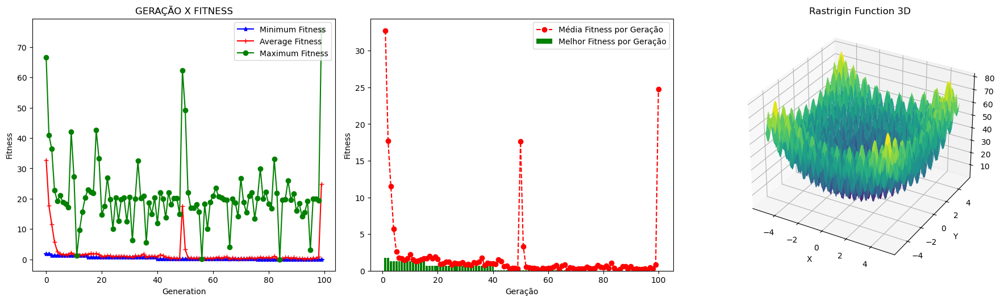

95
Soluções do problema

Best solution generation =  95

Best solution variables =
 [0.0003009280140128332, -0.0004888462479979336, -0.5688469433038505, -4.404507219865393, 3.3360181631002144, 4.802973060924832, -3.3585394411521556, 0.9598358543067187, -3.168583046680011, 0.48063345343549213]

Best solution fitness =  6.537576981102688e-05


,Generation,Min Fitness,Average Fitness,Max Fitness,Std Fitness
0,0,1.762393,32.742173,66.524848,15.611387
1,1,1.762393,17.665685,40.940198,9.139836
2,2,1.293199,11.507848,36.396231,7.430707
3,3,1.293199,5.734974,22.678664,4.920727
4,4,1.293199,2.596838,19.200417,2.471230
...,...,...,...,...,...
95,95,0.000065,0.054243,3.075132,0.373294
96,96,0.000065,0.430463,19.974827,2.555859
97,97,0.000065,0.270431,20.034215,2.045939
98,98,0.000065,0.811375,19.318731,3.537388


{'Resultado': 3, 'Best Fitness Value': np.float64(6.537576981102688e-05), 'Media Fitness': np.float64(24.75987665179433), 'Desvio Padrão': np.float64(22.575058177087662), 'Variaveis Decisão': [[0.0, -0.0, -0.569, -4.405, 3.336, 4.803, -3.359, 0.96, -3.169, 0.481]], 'Solution Generation': 95, 'Crossover': 0.6, 'Mutação do Individuo': 0.15, 'Percentual apply rce': 30, 'Num Var Diferença': 1, 'Delta': 0.5, 'RCE Num Generations': 50, 'otimização': 'rastrigin'}


,Resultado,Best Fitness Value,Media Fitness,Desvio Padrão,Variaveis Decisão,Solution Generation,Crossover,Mutação do Individuo,Percentual apply rce,Num Var Diferença,Delta,RCE Num Generations,otimização
0,3,0.000065,24.759877,22.575058,"[0.0, -0.0, -0.569, -4.405, 3.336, 4.803, -3.3...",95,0.6,0.15,30,1,0.5,50,rastrigin


Arquivo criado ! /home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/assets/output/results/resultado_RCE_3.xlsx
Método escolhido: Minimizar


/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Fitness' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.





	 RCE being applied! - Generation = 50 

Elitismo HOF Index[0] [-0.006631817733393164, 0.008342091435213916, -5.728689926155125, -4.51552963802665, 1.721756703667678, -4.1057717738722905, 0.06919036542386525, -3.430392262342477, -1.6404659012441656, 0.030470798625852114] 
 Fitness = (0.022527285534444275,) | Diversidade = -17.59772136022149

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 0.698

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  60
Tamanho Elite =  59

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,50,0,"[-0.006631817733393164, 0.008342091435213916, ...",0.022527,HOF,-17.597721
1,50,1,"[-0.006631817733393164, 0.008342091435213916, ...",0.022527,SIM,-16.029230
2,50,2,"[-0.006631817733393164, 0.008342091435213916, ...",0.022527,SIM,-13.968531
3,50,3,"[-0.006631817733393164, 0.008342091435213916, ...",0.022527,SIM,-18.432705
4,50,4,"[-0.006631817733393164, 0.008342091435213916, ...",0.022527,SIM,-15.366328
5,50,5,"[-0.006631817733393164, 0.008342091435213916, ...",0.022527,SIM,-8.985922
6,50,6,"[-0.006631817733393164, 0.008342091435213916, ...",0.022527,SIM,-15.822969
7,50,7,"[-0.006631817733393164, 0.008342091435213916, ...",0.022527,SIM,-16.265075
8,50,8,"[-0.006631817733393164, 0.008342091435213916, ...",0.022527,SIM,-16.324519
9,50,9,"[-0.006631817733393164, 0.008342091435213916, ...",0.022527,SIM,-17.245601




	 RCE being applied! - Generation = 100 

Elitismo HOF Index[11] [-0.00031619274094539865, 0.0036937563103351624, -5.728689926155125, -3.753142116362363, 1.721756703667678, -4.1057717738722905, 0.06919036542386525, -3.430392262342477, -0.34807242196492894, 0.030470798625852114] 
 Fitness = (0.0027265429717502343,) | Diversidade = -15.5412730694104

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 0.085

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  64
Tamanho Elite =  63

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,100,0,"[-0.00031619274094539865, 0.003693756310335162...",0.002727,HOF,-15.541273
1,100,1,"[-0.00031619274094539865, 0.003693756310335162...",0.002727,SIM,-17.458553
2,100,2,"[-0.00031619274094539865, 0.003693756310335162...",0.002727,SIM,-13.880506
3,100,3,"[-0.00031619274094539865, 0.003693756310335162...",0.002727,SIM,-12.618869
4,100,4,"[-0.00031619274094539865, 0.003693756310335162...",0.002727,SIM,-13.611020
5,100,5,"[-0.00031619274094539865, 0.003693756310335162...",0.002727,SIM,-19.310049
6,100,6,"[-0.00031619274094539865, 0.003693756310335162...",0.002727,SIM,-18.258027
7,100,7,"[-0.00031619274094539865, 0.003693756310335162...",0.002727,SIM,-12.076238
8,100,8,"[-0.00031619274094539865, 0.003693756310335162...",0.002727,SIM,-19.306811
9,100,9,"[-0.00031619274094539865, 0.003693756310335162...",0.002727,SIM,-16.341348




Evolução concluída  - 100%

	 VISUALIZANDO OS RESULTADOS



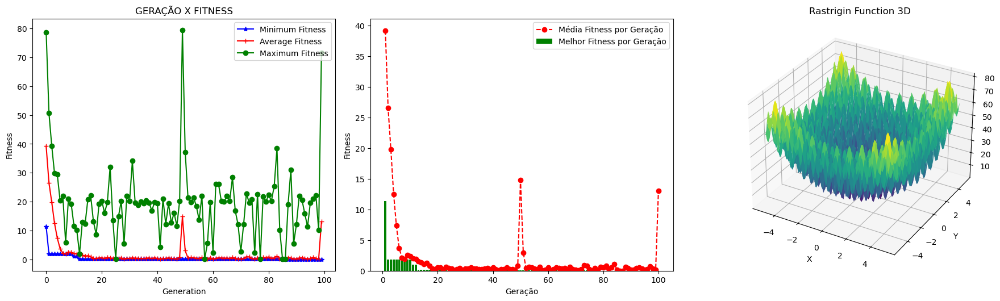

85
Soluções do problema

Best solution generation =  85

Best solution variables =
 [-0.00031619274094539865, 0.0036937563103351624, -5.728689926155125, -3.753142116362363, 1.721756703667678, -4.1057717738722905, 0.06919036542386525, -3.430392262342477, -0.34807242196492894, 0.030470798625852114]

Best solution fitness =  0.0027265429717502343


,Generation,Min Fitness,Average Fitness,Max Fitness,Std Fitness
0,0,11.331642,39.190863,78.735266,14.859164
1,1,1.868439,26.543448,50.723545,9.698366
2,2,1.868439,19.815927,39.348351,7.539886
3,3,1.868439,12.525383,29.813266,6.908289
4,4,1.868439,7.351799,29.395534,5.889658
...,...,...,...,...,...
95,95,0.002727,0.250506,19.598462,2.011736
96,96,0.002727,0.674338,21.067624,3.168491
97,97,0.002727,0.321237,22.232808,2.314568
98,98,0.002727,0.153809,10.065896,1.115516


{'Resultado': 4, 'Best Fitness Value': np.float64(0.0027265429717502343), 'Media Fitness': np.float64(13.002519583414204), 'Desvio Padrão': np.float64(19.737201240710423), 'Variaveis Decisão': [[-0.0, 0.004, -5.729, -3.753, 1.722, -4.106, 0.069, -3.43, -0.348, 0.03]], 'Solution Generation': 85, 'Crossover': 0.6, 'Mutação do Individuo': 0.15, 'Percentual apply rce': 30, 'Num Var Diferença': 1, 'Delta': 0.5, 'RCE Num Generations': 50, 'otimização': 'rastrigin'}


,Resultado,Best Fitness Value,Media Fitness,Desvio Padrão,Variaveis Decisão,Solution Generation,Crossover,Mutação do Individuo,Percentual apply rce,Num Var Diferença,Delta,RCE Num Generations,otimização
0,4,0.002727,13.00252,19.737201,"[-0.0, 0.004, -5.729, -3.753, 1.722, -4.106, 0...",85,0.6,0.15,30,1,0.5,50,rastrigin


Arquivo criado ! /home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/assets/output/results/resultado_RCE_4.xlsx
Método escolhido: Minimizar


/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Fitness' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.





	 RCE being applied! - Generation = 50 

Elitismo HOF Index[0] [0.005535117084216612, -0.0605544573872302, -0.41671869267482986, 1.86733909313697, -2.1838025132674357, 2.5721641266063413, -4.633459671448115, 3.116250701732386, 2.319908149411325, -0.35520179149834286] 
 Fitness = (0.7248605816148768,) | Diversidade = 2.231460061695285

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 22.471

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  60
Tamanho Elite =  59

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,50,0,"[0.005535117084216612, -0.0605544573872302, -0...",0.724861,HOF,2.231460
1,50,1,"[0.005535117084216612, 1.726656702333245, -0.4...",14.448871,SIM,-4.752475
2,50,2,"[0.005535117084216612, -0.0605544573872302, -0...",0.724861,SIM,2.493041
3,50,3,"[0.005535117084216612, -0.0605544573872302, -0...",0.724861,SIM,8.666985
4,50,4,"[0.005535117084216612, -0.0605544573872302, 0....",0.724861,SIM,1.370131
5,50,5,"[0.005535117084216612, 1.6502120696345077, -0....",18.596345,SIM,8.758184
6,50,6,"[0.005535117084216612, -0.0605544573872302, -0...",0.724861,SIM,-2.973369
7,50,7,"[0.005535117084216612, -0.0605544573872302, -0...",0.724861,SIM,-5.035000
8,50,8,"[0.005535117084216612, -0.0605544573872302, -0...",0.724861,SIM,0.321743
9,50,9,"[0.005535117084216612, -0.0605544573872302, -0...",0.724861,SIM,0.832953




	 RCE being applied! - Generation = 100 

Elitismo HOF Index[51] [0.005535117084216612, 0.008283981341404331, -0.41671869267482986, -1.9122806748880854, -2.1838025132674357, 2.5721641266063413, -4.633459671448115, -4.150209610781017, 2.319908149411325, -1.6567254217066174] 
 Fitness = (0.019689101804196696,) | Diversidade = -10.047305210322813

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 0.61

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  67
Tamanho Elite =  66

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,100,0,"[0.005535117084216612, 0.008283981341404331, -...",0.019689,HOF,-10.047305
1,100,1,"[0.005535117084216612, 0.008283981341404331, -...",0.019689,SIM,-9.194112
2,100,2,"[0.005535117084216612, 0.008283981341404331, 0...",0.019689,SIM,-8.078862
3,100,3,"[0.005535117084216612, 0.008283981341404331, 0...",0.019689,SIM,-5.862146
4,100,4,"[0.005535117084216612, 0.008283981341404331, -...",0.019689,SIM,-11.002940
5,100,5,"[0.005535117084216612, 0.008283981341404331, 0...",0.019689,SIM,-5.857381
6,100,6,"[0.005535117084216612, 0.008283981341404331, 0...",0.019689,SIM,-6.373700
7,100,7,"[0.005535117084216612, 0.008283981341404331, 0...",0.019689,SIM,-6.748771
8,100,8,"[0.005535117084216612, 0.008283981341404331, 0...",0.019689,SIM,-9.099155
9,100,9,"[0.005535117084216612, 0.008283981341404331, 0...",0.019689,SIM,-4.980688




Evolução concluída  - 100%

	 VISUALIZANDO OS RESULTADOS



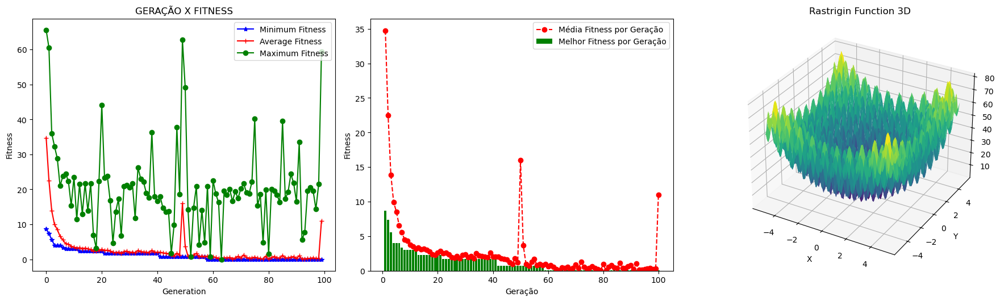

58
Soluções do problema

Best solution generation =  58

Best solution variables =
 [0.005535117084216612, 0.008283981341404331, -0.41671869267482986, -1.9122806748880854, -2.1838025132674357, 2.5721641266063413, -4.633459671448115, -4.150209610781017, 2.319908149411325, -1.6567254217066174]

Best solution fitness =  0.019689101804196696


,Generation,Min Fitness,Average Fitness,Max Fitness,Std Fitness
0,0,8.650323,34.758546,65.575154,13.565898
1,1,7.373807,22.514296,60.486406,10.606519
2,2,5.584161,13.891995,36.005748,6.630653
3,3,4.036129,9.951789,32.278003,4.031869
4,4,4.036129,8.528122,28.867102,3.691262
...,...,...,...,...,...
95,95,0.019689,0.301620,20.529071,2.107636
96,96,0.019689,0.424986,19.613516,2.595667
97,97,0.019689,0.247416,14.342392,1.535122
98,98,0.019689,0.298558,21.485798,2.219514


{'Resultado': 5, 'Best Fitness Value': np.float64(0.019689101804196696), 'Media Fitness': np.float64(10.979958938908931), 'Desvio Padrão': np.float64(18.186206877881048), 'Variaveis Decisão': [[0.006, 0.008, -0.417, -1.912, -2.184, 2.572, -4.633, -4.15, 2.32, -1.657]], 'Solution Generation': 58, 'Crossover': 0.6, 'Mutação do Individuo': 0.15, 'Percentual apply rce': 30, 'Num Var Diferença': 1, 'Delta': 0.5, 'RCE Num Generations': 50, 'otimização': 'rastrigin'}


,Resultado,Best Fitness Value,Media Fitness,Desvio Padrão,Variaveis Decisão,Solution Generation,Crossover,Mutação do Individuo,Percentual apply rce,Num Var Diferença,Delta,RCE Num Generations,otimização
0,5,0.019689,10.979959,18.186207,"[0.006, 0.008, -0.417, -1.912, -2.184, 2.572, ...",58,0.6,0.15,30,1,0.5,50,rastrigin


Arquivo criado ! /home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/assets/output/results/resultado_RCE_5.xlsx
Método escolhido: Minimizar


/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Fitness' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.





	 RCE being applied! - Generation = 50 

Elitismo HOF Index[0] [0.01489088237317393, 0.013814302583700977, 4.542716890784072, 1.6081578968098866, 0.9658922582579342, -3.0896717727576055, 3.336338240717324, -0.6783786085274146, 0.09775858154480377, 4.137144556881008] 
 Fitness = (0.08179572143623481,) | Diversidade = 10.948663228666883

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 2.536

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  84
Tamanho Elite =  83

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,50,0,"[0.01489088237317393, 0.013814302583700977, 4....",0.081796,HOF,10.948663
1,50,1,"[0.01489088237317393, 0.013814302583700977, 4....",0.081796,SIM,11.979319
2,50,2,"[0.01489088237317393, 0.013814302583700977, 4....",0.081796,SIM,9.896417
3,50,3,"[0.01489088237317393, 0.013814302583700977, 4....",0.081796,SIM,4.168876
4,50,4,"[0.01489088237317393, 0.013814302583700977, 4....",0.081796,SIM,7.333079
5,50,5,"[0.01489088237317393, 0.013814302583700977, 4....",0.081796,SIM,12.979609
6,50,6,"[0.01489088237317393, 0.013814302583700977, 5....",0.081796,SIM,2.638236
7,50,7,"[0.01489088237317393, 0.013814302583700977, 4....",0.081796,SIM,13.666839
8,50,8,"[0.01489088237317393, 0.013814302583700977, 4....",0.081796,SIM,11.241381
9,50,9,"[0.01489088237317393, 0.013814302583700977, 4....",0.081796,SIM,6.558955




	 RCE being applied! - Generation = 100 

Elitismo HOF Index[0] [0.01489088237317393, 0.0025213337292777985, 5.453690018801195, 0.4688177007251022, -0.4035253975422194, -3.4533347426399588, 3.336338240717324, -0.6783786085274146, 0.09775858154480377, 3.4808765548071103] 
 Fitness = (0.04522039656597876,) | Diversidade = 8.319654563988394

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 1.402

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  85
Tamanho Elite =  84

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,100,0,"[0.01489088237317393, 0.0025213337292777985, 5...",0.045220,HOF,8.319655
1,100,1,"[0.01489088237317393, 0.013814302583700977, 4....",0.081796,SIM,11.216969
2,100,2,"[0.01489088237317393, 0.013814302583700977, 4....",0.081796,SIM,8.250192
3,100,3,"[0.01489088237317393, 0.013814302583700977, 5....",0.081796,SIM,15.846711
4,100,4,"[0.01489088237317393, 0.013814302583700977, 5....",0.081796,SIM,13.906959
5,100,5,"[0.01489088237317393, 0.013814302583700977, 4....",0.081796,SIM,15.270285
6,100,6,"[0.01489088237317393, 0.013814302583700977, 4....",0.081796,SIM,-0.850833
7,100,7,"[0.01489088237317393, 0.013814302583700977, 4....",0.081796,SIM,2.758521
8,100,8,"[0.01489088237317393, 0.013814302583700977, 5....",0.081796,SIM,6.851564
9,100,9,"[0.01489088237317393, 0.013814302583700977, 4....",0.081796,SIM,11.658618




Evolução concluída  - 100%

	 VISUALIZANDO OS RESULTADOS



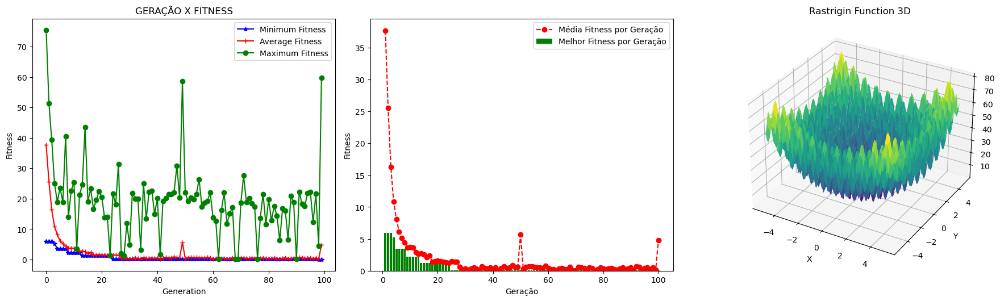

98
Soluções do problema

Best solution generation =  98

Best solution variables =
 [0.01489088237317393, 0.0025213337292777985, 5.453690018801195, 0.4688177007251022, -0.4035253975422194, -3.4533347426399588, 3.336338240717324, -0.6783786085274146, 0.09775858154480377, 3.4808765548071103]

Best solution fitness =  0.04522039656597876


,Generation,Min Fitness,Average Fitness,Max Fitness,Std Fitness
0,0,5.914502,37.675805,75.462421,15.206583
1,1,5.914502,25.539104,51.316671,11.450379
2,2,5.914502,16.304812,39.311233,7.278009
3,3,5.241894,10.851181,25.011059,3.739163
4,4,3.421710,8.110413,18.879018,3.009945
...,...,...,...,...,...
95,95,0.081796,0.468727,22.214697,2.722018
96,96,0.081796,0.202940,12.196241,1.205372
97,97,0.081796,0.492580,21.557032,2.878536
98,98,0.045220,0.123876,4.362960,0.426075


{'Resultado': 6, 'Best Fitness Value': np.float64(0.04522039656597876), 'Media Fitness': np.float64(4.776284403170563), 'Desvio Padrão': np.float64(12.669817495438625), 'Variaveis Decisão': [[0.015, 0.003, 5.454, 0.469, -0.404, -3.453, 3.336, -0.678, 0.098, 3.481]], 'Solution Generation': 98, 'Crossover': 0.6, 'Mutação do Individuo': 0.15, 'Percentual apply rce': 30, 'Num Var Diferença': 1, 'Delta': 0.5, 'RCE Num Generations': 50, 'otimização': 'rastrigin'}


,Resultado,Best Fitness Value,Media Fitness,Desvio Padrão,Variaveis Decisão,Solution Generation,Crossover,Mutação do Individuo,Percentual apply rce,Num Var Diferença,Delta,RCE Num Generations,otimização
0,6,0.04522,4.776284,12.669817,"[0.015, 0.003, 5.454, 0.469, -0.404, -3.453, 3...",98,0.6,0.15,30,1,0.5,50,rastrigin


Arquivo criado ! /home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/assets/output/results/resultado_RCE_6.xlsx
Método escolhido: Minimizar


/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Fitness' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.





	 RCE being applied! - Generation = 50 

Elitismo HOF Index[0] [0.028002195968976518, -0.9924363225835817, -2.347165415745789, 3.3724418044956286, 0.34494562402767953, -4.856148739734411, 0.3720645705377912, -0.6195131760381591, -4.221127464013783, -2.7468075440309594] 
 Fitness = (1.1513853035033694,) | Diversidade = -11.665744467116607

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 35.693

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  67
Tamanho Elite =  66

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,50,0,"[0.028002195968976518, -0.9924363225835817, -2...",1.151385,HOF,-11.665744
1,50,1,"[0.028002195968976518, -0.9924363225835817, -2...",1.151385,SIM,-15.337945
2,50,2,"[0.028002195968976518, -0.9924363225835817, -2...",1.151385,SIM,-12.507772
3,50,3,"[0.028002195968976518, -0.9924363225835817, -2...",1.151385,SIM,-10.664325
4,50,4,"[0.028002195968976518, -0.9924363225835817, -2...",1.151385,SIM,-12.770634
5,50,5,"[0.028002195968976518, -0.9924363225835817, -2...",1.151385,SIM,-7.356703
6,50,6,"[0.028002195968976518, -0.9924363225835817, -2...",1.151385,SIM,-13.675316
7,50,7,"[0.028002195968976518, -0.9924363225835817, -4...",1.151385,SIM,-13.740120
8,50,8,"[0.028002195968976518, -0.9924363225835817, -4...",1.151385,SIM,-10.135620
9,50,9,"[0.028002195968976518, -0.9924363225835817, -2...",1.151385,SIM,-10.177411




	 RCE being applied! - Generation = 100 

Elitismo HOF Index[28] [0.013169473099769777, 0.01569212974877537, -1.977551957610627, 4.768189854804838, 0.34494562402767953, -4.856148739734411, 0.3720645705377912, -3.3923584018663773, -4.624771836059366, -1.7698576274546884] 
 Fitness = (0.08320189359551655,) | Diversidade = -11.106626910506616

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 2.579

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  30
Tamanho Elite =  29

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,100,0,"[0.013169473099769777, 0.01569212974877537, -1...",0.083202,HOF,-11.106627
1,100,1,"[0.013169473099769777, 0.01569212974877537, -1...",0.083202,SIM,-13.349093
2,100,2,"[0.013169473099769777, 0.01569212974877537, -1...",0.083202,SIM,-8.615421
3,100,3,"[0.013169473099769777, 0.01569212974877537, -1...",0.083202,SIM,-9.828543
4,100,4,"[0.013169473099769777, 0.01569212974877537, -2...",0.083202,SIM,-10.655822
5,100,5,"[0.013169473099769777, 0.01569212974877537, -2...",0.083202,SIM,-12.112788
6,100,6,"[0.013169473099769777, 0.01569212974877537, -1...",0.083202,SIM,-8.547470
7,100,7,"[0.013169473099769777, 0.01569212974877537, -2...",0.083202,SIM,-11.601693
8,100,8,"[0.013169473099769777, 0.01569212974877537, -1...",0.083202,SIM,-13.781107
9,100,9,"[0.013169473099769777, 0.01569212974877537, -2...",0.083202,SIM,-12.578643




Evolução concluída  - 100%

	 VISUALIZANDO OS RESULTADOS



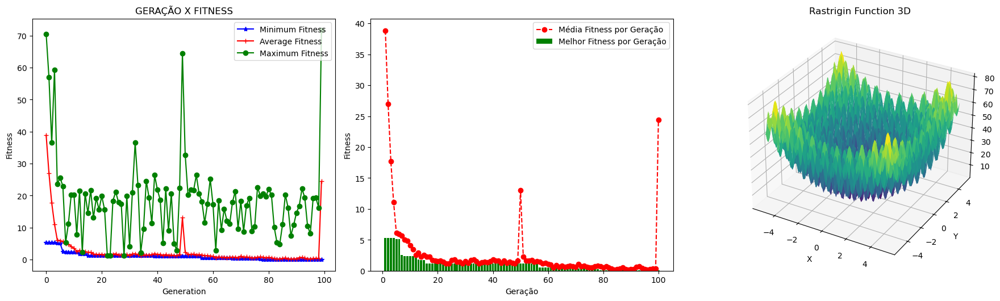

78
Soluções do problema

Best solution generation =  78

Best solution variables =
 [0.013169473099769777, 0.01569212974877537, -1.977551957610627, 4.768189854804838, 0.34494562402767953, -4.856148739734411, 0.3720645705377912, -3.3923584018663773, -4.624771836059366, -1.7698576274546884]

Best solution fitness =  0.08320189359551655


,Generation,Min Fitness,Average Fitness,Max Fitness,Std Fitness
0,0,5.284217,38.851670,70.493390,13.731906
1,1,5.284217,27.001565,56.983658,11.421607
2,2,5.284217,17.692974,36.504047,8.828292
3,3,5.284217,11.045826,59.276537,8.624050
4,4,5.094400,6.100237,23.668382,2.637916
...,...,...,...,...,...
95,95,0.083202,0.200578,8.084226,0.875219
96,96,0.083202,0.289256,19.175316,1.904083
97,97,0.083202,0.380750,19.292461,2.171063
98,98,0.083202,0.369182,16.226827,2.018788


{'Resultado': 7, 'Best Fitness Value': np.float64(0.08320189359551655), 'Media Fitness': np.float64(24.420510468569827), 'Desvio Padrão': np.float64(19.70129581522927), 'Variaveis Decisão': [[0.013, 0.016, -1.978, 4.768, 0.345, -4.856, 0.372, -3.392, -4.625, -1.77]], 'Solution Generation': 78, 'Crossover': 0.6, 'Mutação do Individuo': 0.15, 'Percentual apply rce': 30, 'Num Var Diferença': 1, 'Delta': 0.5, 'RCE Num Generations': 50, 'otimização': 'rastrigin'}


,Resultado,Best Fitness Value,Media Fitness,Desvio Padrão,Variaveis Decisão,Solution Generation,Crossover,Mutação do Individuo,Percentual apply rce,Num Var Diferença,Delta,RCE Num Generations,otimização
0,7,0.083202,24.42051,19.701296,"[0.013, 0.016, -1.978, 4.768, 0.345, -4.856, 0...",78,0.6,0.15,30,1,0.5,50,rastrigin


Arquivo criado ! /home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/assets/output/results/resultado_RCE_7.xlsx
Método escolhido: Minimizar


/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Fitness' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.





	 RCE being applied! - Generation = 50 

Elitismo HOF Index[0] [0.0033360147628919423, -0.051001849010035794, 2.9065993924397744, 3.87291198474841, -3.98049923762927, 1.4124071163054612, 0.640025186347952, 1.2573999886432108, -0.2406782985360003, -3.9820045368698027] 
 Fitness = (0.5138841574697572,) | Diversidade = 1.8384957612025916

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 15.93

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  42
Tamanho Elite =  41

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,50,0,"[0.0033360147628919423, -0.051001849010035794,...",0.513884,HOF,1.838496
1,50,1,"[0.0033360147628919423, -0.051001849010035794,...",0.513884,SIM,8.482495
2,50,2,"[0.0033360147628919423, -0.051001849010035794,...",0.513884,SIM,3.613262
3,50,3,"[0.0033360147628919423, -0.051001849010035794,...",0.513884,SIM,0.816629
4,50,4,"[0.0033360147628919423, -0.051001849010035794,...",0.513884,SIM,3.737607
5,50,5,"[0.0033360147628919423, -0.051001849010035794,...",0.513884,SIM,7.590591
6,50,6,"[0.0033360147628919423, -0.051001849010035794,...",0.513884,SIM,-2.072703
7,50,7,"[0.0033360147628919423, -0.051001849010035794,...",0.513884,SIM,3.703408
8,50,8,"[0.0033360147628919423, -0.051001849010035794,...",0.513884,SIM,-1.831097
9,50,9,"[0.0033360147628919423, -0.051001849010035794,...",0.513884,SIM,9.485443




	 RCE being applied! - Generation = 100 

Elitismo HOF Index[6] [0.0033360147628919423, 0.027585083596706347, 3.802375268621831, 3.87291198474841, -3.98049923762927, 1.4124071163054612, 2.091656454771182, -0.4140070331067922, -0.2406782985360003, -3.9820045368698027] 
 Fitness = (0.1527960330595981,) | Diversidade = 2.5930828166646176

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 4.737

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  73
Tamanho Elite =  72

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,100,0,"[0.0033360147628919423, 0.027585083596706347, ...",0.152796,HOF,2.593083
1,100,1,"[0.0033360147628919423, 0.027585083596706347, ...",0.152796,SIM,2.382497
2,100,2,"[0.0033360147628919423, 0.027585083596706347, ...",0.152796,SIM,3.068540
3,100,3,"[0.0033360147628919423, 0.027585083596706347, ...",0.152796,SIM,4.686996
4,100,4,"[0.0033360147628919423, 0.027585083596706347, ...",0.152796,SIM,7.707682
5,100,5,"[0.0033360147628919423, 0.027585083596706347, ...",0.152796,SIM,0.382310
6,100,6,"[0.0033360147628919423, 0.027585083596706347, ...",0.152796,SIM,4.191024
7,100,7,"[0.0033360147628919423, 0.027585083596706347, ...",0.152796,SIM,-0.881235
8,100,8,"[0.0033360147628919423, 0.027585083596706347, ...",0.152796,SIM,4.172536
9,100,9,"[0.0033360147628919423, 0.027585083596706347, ...",0.152796,SIM,-1.545746




Evolução concluída  - 100%

	 VISUALIZANDO OS RESULTADOS



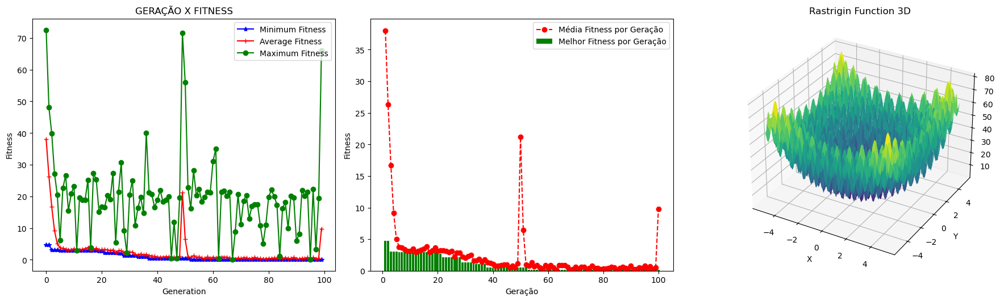

52
Soluções do problema

Best solution generation =  52

Best solution variables =
 [0.0033360147628919423, 0.027585083596706347, 3.802375268621831, 3.87291198474841, -3.98049923762927, 1.4124071163054612, 2.091656454771182, -0.4140070331067922, -0.2406782985360003, -3.9820045368698027]

Best solution fitness =  0.1527960330595981


,Generation,Min Fitness,Average Fitness,Max Fitness,Std Fitness
0,0,4.709991,38.036543,72.538318,14.636759
1,1,4.709991,26.297179,48.027969,10.649830
2,2,3.066669,16.734595,39.899330,8.501613
3,3,3.066669,9.177099,27.195146,5.531094
4,4,3.066669,5.029617,20.487000,2.827378
...,...,...,...,...,...
95,95,0.152796,0.152796,0.152796,0.000000
96,96,0.152796,0.713312,22.263347,3.158408
97,97,0.152796,0.222541,3.348881,0.435084
98,98,0.152796,0.511013,19.477502,2.446653


{'Resultado': 8, 'Best Fitness Value': np.float64(0.1527960330595981), 'Media Fitness': np.float64(9.81472409059634), 'Desvio Padrão': np.float64(16.999732772538447), 'Variaveis Decisão': [[0.003, 0.028, 3.802, 3.873, -3.98, 1.412, 2.092, -0.414, -0.241, -3.982]], 'Solution Generation': 52, 'Crossover': 0.6, 'Mutação do Individuo': 0.15, 'Percentual apply rce': 30, 'Num Var Diferença': 1, 'Delta': 0.5, 'RCE Num Generations': 50, 'otimização': 'rastrigin'}


,Resultado,Best Fitness Value,Media Fitness,Desvio Padrão,Variaveis Decisão,Solution Generation,Crossover,Mutação do Individuo,Percentual apply rce,Num Var Diferença,Delta,RCE Num Generations,otimização
0,8,0.152796,9.814724,16.999733,"[0.003, 0.028, 3.802, 3.873, -3.98, 1.412, 2.0...",52,0.6,0.15,30,1,0.5,50,rastrigin


Arquivo criado ! /home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/assets/output/results/resultado_RCE_8.xlsx
Método escolhido: Minimizar


/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Fitness' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.





	 RCE being applied! - Generation = 50 

Elitismo HOF Index[0] [-0.0009202873886627883, -0.004883328082254661, -2.3662880839895672, -4.201356001526949, -2.614631868858037, 0.03271983288147684, -3.7204632197430376, 4.071501330131606, 4.27919657227132, 1.9018107896084562] 
 Fitness = (0.004898689167225356,) | Diversidade = -2.623314264695649

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 0.152

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  87
Tamanho Elite =  86

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,50,0,"[-0.0009202873886627883, -0.004883328082254661...",0.004899,HOF,-2.623314
1,50,1,"[-0.0009202873886627883, -0.004883328082254661...",0.004899,SIM,-1.902922
2,50,2,"[-0.0009202873886627883, -0.004883328082254661...",0.004899,SIM,-3.194617
3,50,3,"[-0.0009202873886627883, -0.004883328082254661...",0.004899,SIM,9.211974
4,50,4,"[-0.0009202873886627883, -0.004883328082254661...",0.004899,SIM,0.337106
5,50,5,"[-0.0009202873886627883, -0.004883328082254661...",0.004899,SIM,-11.729547
6,50,6,"[-0.0009202873886627883, -0.004883328082254661...",0.004899,SIM,-7.968744
7,50,7,"[-0.0009202873886627883, -0.004883328082254661...",0.004899,SIM,-15.400122
8,50,8,"[-0.0009202873886627883, -0.004883328082254661...",0.004899,SIM,3.916883
9,50,9,"[-0.0009202873886627883, -0.004883328082254661...",0.004899,SIM,-1.109957




	 RCE being applied! - Generation = 100 

Elitismo HOF Index[85] [-0.0009202873886627883, 0.0010154458220002762, -1.7161504985211333, 1.2495455545560703, -2.614631868858037, 4.736189713463296, -4.481104164570773, 4.071501330131606, 4.666143447960111, 1.9018107896084562] 
 Fitness = (0.00037259090905905623,) | Diversidade = 7.813399462202933

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 0.012

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  56
Tamanho Elite =  55

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,100,0,"[-0.0009202873886627883, 0.0010154458220002762...",0.000373,HOF,7.813399
1,100,1,"[-0.0009202873886627883, 0.0010154458220002762...",0.000373,SIM,4.546804
2,100,2,"[-0.0009202873886627883, 0.0010154458220002762...",0.000373,SIM,6.045123
3,100,3,"[-0.0009202873886627883, 0.0010154458220002762...",0.000373,SIM,6.852158
4,100,4,"[-0.0009202873886627883, 0.0010154458220002762...",0.000373,SIM,2.960872
5,100,5,"[-0.0009202873886627883, 0.0010154458220002762...",0.000373,SIM,7.880239
6,100,6,"[-0.0009202873886627883, 0.0010154458220002762...",0.000373,SIM,-2.896753
7,100,7,"[-0.0009202873886627883, 0.0010154458220002762...",0.000373,SIM,-2.630904
8,100,8,"[-0.0009202873886627883, 0.0010154458220002762...",0.000373,SIM,-1.070280
9,100,9,"[-0.0009202873886627883, 0.0010154458220002762...",0.000373,SIM,-2.338760




Evolução concluída  - 100%

	 VISUALIZANDO OS RESULTADOS



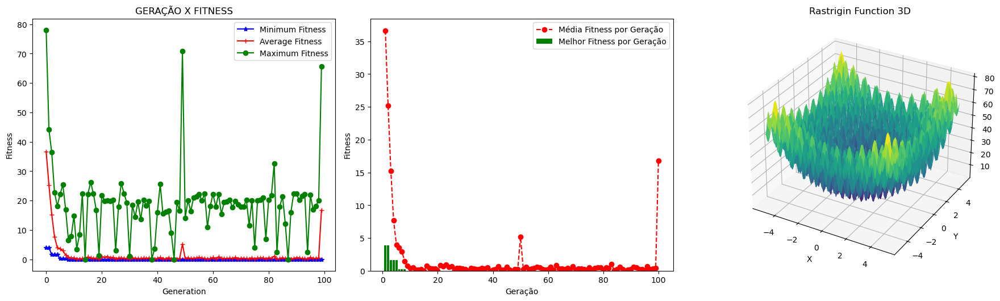

67
Soluções do problema

Best solution generation =  67

Best solution variables =
 [-0.0009202873886627883, 0.0010154458220002762, -1.7161504985211333, 1.2495455545560703, -2.614631868858037, 4.736189713463296, -4.481104164570773, 4.071501330131606, 4.666143447960111, 1.9018107896084562]

Best solution fitness =  0.00037259090905905623


,Generation,Min Fitness,Average Fitness,Max Fitness,Std Fitness
0,0,3.907067,36.634335,78.035602,14.521310
1,1,3.907067,25.186374,44.070547,9.577002
2,2,1.579022,15.221504,36.339482,8.970812
3,3,1.579022,7.680642,22.799254,6.053745
4,4,1.579022,3.990790,18.128109,1.739639
...,...,...,...,...,...
95,95,0.000373,0.670741,21.924287,3.505643
96,96,0.000373,0.216459,16.909539,1.741655
97,97,0.000373,0.359232,18.156492,2.377100
98,98,0.000373,0.417595,19.961423,2.563944


{'Resultado': 9, 'Best Fitness Value': np.float64(0.00037259090905905623), 'Media Fitness': np.float64(16.76335676737325), 'Desvio Padrão': np.float64(21.004025288671926), 'Variaveis Decisão': [[-0.001, 0.001, -1.716, 1.25, -2.615, 4.736, -4.481, 4.072, 4.666, 1.902]], 'Solution Generation': 67, 'Crossover': 0.6, 'Mutação do Individuo': 0.15, 'Percentual apply rce': 30, 'Num Var Diferença': 1, 'Delta': 0.5, 'RCE Num Generations': 50, 'otimização': 'rastrigin'}


,Resultado,Best Fitness Value,Media Fitness,Desvio Padrão,Variaveis Decisão,Solution Generation,Crossover,Mutação do Individuo,Percentual apply rce,Num Var Diferença,Delta,RCE Num Generations,otimização
0,9,0.000373,16.763357,21.004025,"[-0.001, 0.001, -1.716, 1.25, -2.615, 4.736, -...",67,0.6,0.15,30,1,0.5,50,rastrigin


Arquivo criado ! /home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/assets/output/results/resultado_RCE_9.xlsx
Método escolhido: Minimizar


/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Fitness' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.





	 RCE being applied! - Generation = 50 

Elitismo HOF Index[0] [-0.0016860104684494129, 0.008158746592745132, -5.0109189605821705, 0.8940822325108932, 0.06973514814222326, -0.65036950438496, -3.9117762382091543, -1.5668232250158995, 5.0821014343118245, -3.32302685051865] 
 Fitness = (0.013767071449295898,) | Diversidade = -8.410523227621598

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 0.427

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  57
Tamanho Elite =  56

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,50,0,"[-0.0016860104684494129, 0.008158746592745132,...",0.013767,HOF,-8.410523
1,50,1,"[-0.004489579821371863, 0.008158746592745132, ...",0.017202,SIM,-10.031925
2,50,2,"[-0.0016860104684494129, 0.008158746592745132,...",0.013767,SIM,-10.528485
3,50,3,"[-0.004489579821371863, 0.008158746592745132, ...",0.017202,SIM,-7.041204
4,50,4,"[-0.004489579821371863, 0.008158746592745132, ...",0.017202,SIM,-11.030942
5,50,5,"[-0.004489579821371863, 0.008158746592745132, ...",0.017202,SIM,-9.866232
6,50,6,"[-0.004489579821371863, 0.008158746592745132, ...",0.017202,SIM,-9.867167
7,50,7,"[-0.004489579821371863, 0.008158746592745132, ...",0.017202,SIM,-10.303113
8,50,8,"[-0.004489579821371863, 0.008158746592745132, ...",0.017202,SIM,-9.595979
9,50,9,"[-0.004489579821371863, 0.008158746592745132, ...",0.017202,SIM,-8.179590




	 RCE being applied! - Generation = 100 

Elitismo HOF Index[0] [-0.0016860104684494129, 0.008158746592745132, -5.0109189605821705, 0.8940822325108932, 0.06973514814222326, -0.65036950438496, -3.9117762382091543, -1.5668232250158995, 5.0821014343118245, -3.32302685051865] 
 Fitness = (0.013767071449295898,) | Diversidade = -8.410523227621598

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 0.427

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  68
Tamanho Elite =  67

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,100,0,"[-0.0016860104684494129, 0.008158746592745132,...",0.013767,HOF,-8.410523
1,100,1,"[-0.0016860104684494129, 0.008158746592745132,...",0.013767,SIM,-5.193631
2,100,2,"[-0.0016860104684494129, 0.008158746592745132,...",0.013767,SIM,-12.678820
3,100,3,"[-0.0016860104684494129, 0.008158746592745132,...",0.013767,SIM,-8.579219
4,100,4,"[-0.0016860104684494129, 0.008158746592745132,...",0.013767,SIM,-13.136195
5,100,5,"[-0.0016860104684494129, 0.008158746592745132,...",0.013767,SIM,-12.128634
6,100,6,"[-0.0016860104684494129, 0.008158746592745132,...",0.013767,SIM,-10.414935
7,100,7,"[-0.0016860104684494129, 0.008158746592745132,...",0.013767,SIM,-10.147573
8,100,8,"[-0.0016860104684494129, 0.008158746592745132,...",0.013767,SIM,-12.982385
9,100,9,"[-0.0016860104684494129, 0.008158746592745132,...",0.013767,SIM,-10.420558




Evolução concluída  - 100%

	 VISUALIZANDO OS RESULTADOS



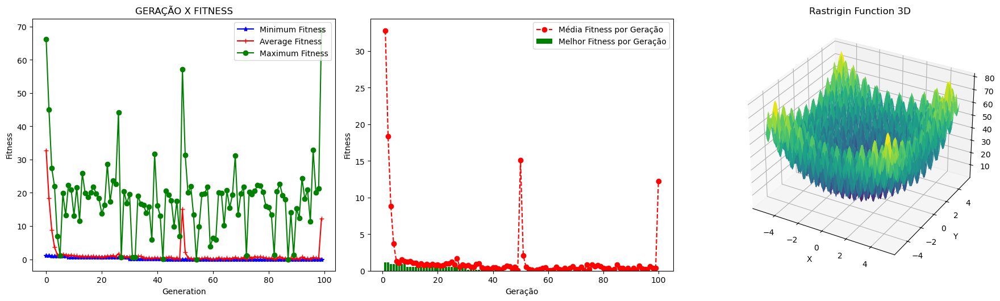

46
Soluções do problema

Best solution generation =  46

Best solution variables =
 [-0.0016860104684494129, 0.008158746592745132, -5.0109189605821705, 0.8940822325108932, 0.06973514814222326, -0.65036950438496, -3.9117762382091543, -1.5668232250158995, 5.0821014343118245, -3.32302685051865]

Best solution fitness =  0.013767071449295898


,Generation,Min Fitness,Average Fitness,Max Fitness,Std Fitness
0,0,1.135442,32.793165,66.133355,14.666297
1,1,1.135442,18.361106,45.093239,10.076457
2,2,0.897489,8.841723,27.459333,7.234237
3,3,0.897489,3.691937,21.939236,4.410622
4,4,0.897489,1.326904,6.952539,0.972560
...,...,...,...,...,...
95,95,0.013767,0.179746,11.369317,1.198192
96,96,0.013767,0.590316,32.885702,3.770396
97,97,0.013767,0.399077,20.037795,2.699301
98,98,0.013767,0.400170,21.351509,2.719826


{'Resultado': 10, 'Best Fitness Value': np.float64(0.013767071449295898), 'Media Fitness': np.float64(12.258697731248235), 'Desvio Padrão': np.float64(19.078236740932713), 'Variaveis Decisão': [[-0.002, 0.008, -5.011, 0.894, 0.07, -0.65, -3.912, -1.567, 5.082, -3.323]], 'Solution Generation': 46, 'Crossover': 0.6, 'Mutação do Individuo': 0.15, 'Percentual apply rce': 30, 'Num Var Diferença': 1, 'Delta': 0.5, 'RCE Num Generations': 50, 'otimização': 'rastrigin'}


,Resultado,Best Fitness Value,Media Fitness,Desvio Padrão,Variaveis Decisão,Solution Generation,Crossover,Mutação do Individuo,Percentual apply rce,Num Var Diferença,Delta,RCE Num Generations,otimização
0,10,0.013767,12.258698,19.078237,"[-0.002, 0.008, -5.011, 0.894, 0.07, -0.65, -3...",46,0.6,0.15,30,1,0.5,50,rastrigin


Arquivo criado ! /home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/assets/output/results/resultado_RCE_10.xlsx
Método escolhido: Minimizar


/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Fitness' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.





	 RCE being applied! - Generation = 50 

Elitismo HOF Index[0] [-0.007804657111955302, 0.00141277957579845, -5.2990507863068625, 0.5698033720792219, -2.862737683880662, -0.9466322645183922, 2.201795597491629, 4.133619668521583, 0.4412000296609854, -1.7642706383578297] 
 Fitness = (0.012478160356234724,) | Diversidade = -3.532664582846484

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 0.387

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  67
Tamanho Elite =  66

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,50,0,"[-0.007804657111955302, 0.00141277957579845, -...",0.012478,HOF,-3.532665
1,50,1,"[0.008093680545290027, 0.00141277957579845, -5...",0.013389,SIM,-12.550467
2,50,2,"[-0.007804657111955302, 0.00141277957579845, -...",0.012478,SIM,-11.784851
3,50,3,"[-0.007804657111955302, 0.00141277957579845, -...",0.012478,SIM,-7.011637
4,50,4,"[-0.007804657111955302, 0.00141277957579845, -...",0.012478,SIM,-4.314244
5,50,5,"[0.008093680545290027, 0.00141277957579845, -5...",0.013389,SIM,-10.600907
6,50,6,"[-0.007804657111955302, 0.00141277957579845, -...",0.012478,SIM,-12.172520
7,50,7,"[0.008093680545290027, 0.00141277957579845, -5...",0.013389,SIM,-13.174895
8,50,8,"[0.008093680545290027, 0.00141277957579845, -5...",0.013389,SIM,-9.382220
9,50,9,"[-0.007804657111955302, 0.00141277957579845, -...",0.012478,SIM,-12.268614




	 RCE being applied! - Generation = 100 

Elitismo HOF Index[0] [-0.007804657111955302, 0.00141277957579845, -5.2990507863068625, 0.5698033720792219, -2.862737683880662, -0.9466322645183922, 2.201795597491629, 4.133619668521583, 0.4412000296609854, -1.7642706383578297] 
 Fitness = (0.012478160356234724,) | Diversidade = -3.532664582846484

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 0.387

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  77
Tamanho Elite =  76

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,100,0,"[-0.007804657111955302, 0.00141277957579845, -...",0.012478,HOF,-3.532665
1,100,1,"[-0.007804657111955302, 0.00141277957579845, -...",0.012478,SIM,-2.322489
2,100,2,"[-0.007804657111955302, 0.00141277957579845, -...",0.012478,SIM,-4.809595
3,100,3,"[-0.007804657111955302, 0.00141277957579845, -...",0.012478,SIM,-12.352107
4,100,4,"[-0.007804657111955302, 0.00141277957579845, -...",0.012478,SIM,-0.611460
5,100,5,"[-0.007804657111955302, 0.00141277957579845, -...",0.012478,SIM,-4.330636
6,100,6,"[-0.007804657111955302, 0.00141277957579845, -...",0.012478,SIM,-11.888385
7,100,7,"[-0.007804657111955302, 0.00141277957579845, -...",0.012478,SIM,-5.738276
8,100,8,"[-0.007804657111955302, 0.008480738707402798, ...",0.026348,SIM,-2.651516
9,100,9,"[-0.007804657111955302, 0.00141277957579845, -...",0.012478,SIM,-3.929123




Evolução concluída  - 100%

	 VISUALIZANDO OS RESULTADOS



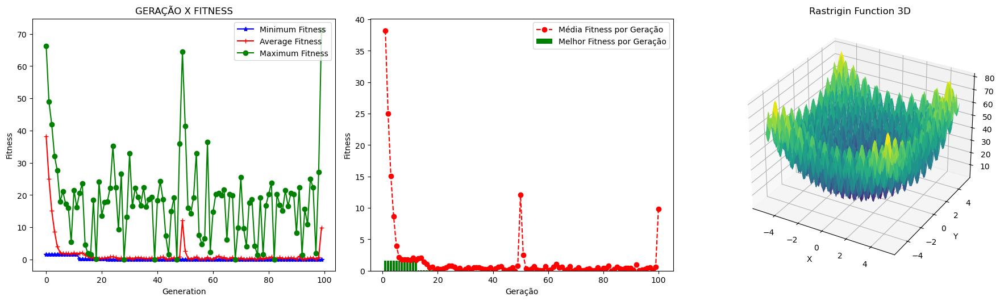

44
Soluções do problema

Best solution generation =  44

Best solution variables =
 [-0.007804657111955302, 0.00141277957579845, -5.2990507863068625, 0.5698033720792219, -2.862737683880662, -0.9466322645183922, 2.201795597491629, 4.133619668521583, 0.4412000296609854, -1.7642706383578297]

Best solution fitness =  0.012478160356234724


,Generation,Min Fitness,Average Fitness,Max Fitness,Std Fitness
0,0,1.571381,38.223883,66.326608,14.362393
1,1,1.571381,24.973019,48.986233,11.155108
2,2,1.571381,15.097877,41.883150,8.251148
3,3,1.571381,8.656676,32.076747,6.428465
4,4,1.571381,3.975496,27.544008,4.559942
...,...,...,...,...,...
95,95,0.012478,0.439699,24.933914,3.032638
96,96,0.012478,0.492893,22.257487,2.954819
97,97,0.012478,0.030442,1.808847,0.178736
98,98,0.012478,0.635285,27.162211,3.213362


{'Resultado': 11, 'Best Fitness Value': np.float64(0.012478160356234724), 'Media Fitness': np.float64(9.805494969334832), 'Desvio Padrão': np.float64(19.01394551777459), 'Variaveis Decisão': [[-0.008, 0.001, -5.299, 0.57, -2.863, -0.947, 2.202, 4.134, 0.441, -1.764]], 'Solution Generation': 44, 'Crossover': 0.6, 'Mutação do Individuo': 0.15, 'Percentual apply rce': 30, 'Num Var Diferença': 1, 'Delta': 0.5, 'RCE Num Generations': 50, 'otimização': 'rastrigin'}


,Resultado,Best Fitness Value,Media Fitness,Desvio Padrão,Variaveis Decisão,Solution Generation,Crossover,Mutação do Individuo,Percentual apply rce,Num Var Diferença,Delta,RCE Num Generations,otimização
0,11,0.012478,9.805495,19.013946,"[-0.008, 0.001, -5.299, 0.57, -2.863, -0.947, ...",44,0.6,0.15,30,1,0.5,50,rastrigin


Arquivo criado ! /home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/assets/output/results/resultado_RCE_11.xlsx
Método escolhido: Minimizar


/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Fitness' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.





	 RCE being applied! - Generation = 50 

Elitismo HOF Index[0] [-0.005864292219492563, -0.050269739200942354, 0.013745856430547931, 4.212953371179206, -0.7680772507396711, 0.5262651622543332, -0.17736784737320732, 1.826800348186532, 2.679745495393613, -0.8335657640523246] 
 Fitness = (0.5040347471807518,) | Diversidade = 7.4243653398585945

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 15.625

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  77
Tamanho Elite =  76

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,50,0,"[-0.005864292219492563, -0.050269739200942354,...",0.504035,HOF,7.424365
1,50,1,"[-0.005864292219492563, -0.050269739200942354,...",0.504035,SIM,7.750644
2,50,2,"[-0.005864292219492563, -0.050269739200942354,...",0.504035,SIM,9.859066
3,50,3,"[-0.005864292219492563, -0.050269739200942354,...",0.504035,SIM,8.150411
4,50,4,"[-0.005864292219492563, -0.050269739200942354,...",0.504035,SIM,6.419976
5,50,5,"[-0.005864292219492563, -0.050269739200942354,...",0.504035,SIM,10.626320
6,50,6,"[-0.005864292219492563, -0.050269739200942354,...",0.504035,SIM,3.772149
7,50,7,"[-0.005864292219492563, -0.050269739200942354,...",0.504035,SIM,6.177030
8,50,8,"[-0.005864292219492563, -0.050269739200942354,...",0.504035,SIM,8.510704
9,50,9,"[-0.005864292219492563, -0.050269739200942354,...",0.504035,SIM,10.484581




	 RCE being applied! - Generation = 100 

Elitismo HOF Index[56] [-0.000315435852241577, -0.045505688420551735, 0.013745856430547931, 5.179452105142195, 2.0513025892083268, 0.8103979953234645, -1.8125830058767356, 1.0523076238089382, 3.786182344918399, -0.8335657640523246] 
 Fitness = (0.40806658832777387,) | Diversidade = 10.201418620630017

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 12.65

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  69
Tamanho Elite =  68

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,100,0,"[-0.000315435852241577, -0.045505688420551735,...",0.408067,HOF,10.201419
1,100,1,"[-0.000315435852241577, -0.045505688420551735,...",0.408067,SIM,6.393527
2,100,2,"[-0.000315435852241577, -0.045505688420551735,...",0.408067,SIM,12.549937
3,100,3,"[-0.000315435852241577, -0.045505688420551735,...",0.408067,SIM,8.944114
4,100,4,"[-0.000315435852241577, -0.045505688420551735,...",0.408067,SIM,6.252667
5,100,5,"[-0.000315435852241577, -0.045505688420551735,...",0.408067,SIM,7.966784
6,100,6,"[-0.000315435852241577, -0.045505688420551735,...",0.408067,SIM,13.495440
7,100,7,"[-0.000315435852241577, -0.045505688420551735,...",0.408067,SIM,11.463855
8,100,8,"[-0.000315435852241577, -0.045505688420551735,...",0.408067,SIM,8.815810
9,100,9,"[-0.000315435852241577, -0.045505688420551735,...",0.408067,SIM,13.073185




Evolução concluída  - 100%

	 VISUALIZANDO OS RESULTADOS



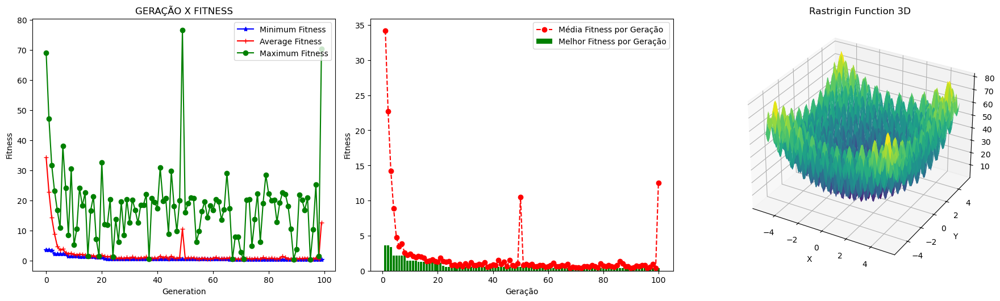

66
Soluções do problema

Best solution generation =  66

Best solution variables =
 [-0.000315435852241577, -0.045505688420551735, 0.013745856430547931, 5.179452105142195, 2.0513025892083268, 0.8103979953234645, -1.8125830058767356, 1.0523076238089382, 3.786182344918399, -0.8335657640523246]

Best solution fitness =  0.40806658832777387


,Generation,Min Fitness,Average Fitness,Max Fitness,Std Fitness
0,0,3.607925,34.210012,69.025503,1.300864e+01
1,1,3.607925,22.722694,47.087825,9.495830e+00
2,2,3.354888,14.211607,31.623176,6.865721e+00
3,3,2.160280,8.873966,23.147317,5.539541e+00
4,4,2.160280,4.753335,16.717934,3.004832e+00
...,...,...,...,...,...
95,95,0.408067,0.408067,0.408067,1.665335e-16
96,96,0.408067,0.506319,10.233316,9.776000e-01
97,97,0.408067,0.926300,25.228886,3.186430e+00
98,98,0.408067,0.418020,1.403360,9.903042e-02


{'Resultado': 12, 'Best Fitness Value': np.float64(0.40806658832777387), 'Media Fitness': np.float64(12.519029871481708), 'Desvio Padrão': np.float64(20.02894217376933), 'Variaveis Decisão': [[-0.0, -0.046, 0.014, 5.179, 2.051, 0.81, -1.813, 1.052, 3.786, -0.834]], 'Solution Generation': 66, 'Crossover': 0.6, 'Mutação do Individuo': 0.15, 'Percentual apply rce': 30, 'Num Var Diferença': 1, 'Delta': 0.5, 'RCE Num Generations': 50, 'otimização': 'rastrigin'}


,Resultado,Best Fitness Value,Media Fitness,Desvio Padrão,Variaveis Decisão,Solution Generation,Crossover,Mutação do Individuo,Percentual apply rce,Num Var Diferença,Delta,RCE Num Generations,otimização
0,12,0.408067,12.51903,20.028942,"[-0.0, -0.046, 0.014, 5.179, 2.051, 0.81, -1.8...",66,0.6,0.15,30,1,0.5,50,rastrigin


Arquivo criado ! /home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/assets/output/results/resultado_RCE_12.xlsx
Método escolhido: Minimizar


/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Fitness' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.





	 RCE being applied! - Generation = 50 

Elitismo HOF Index[0] [0.06212538628816511, 0.04709370431502878, 4.229590828222428, 5.020073091844355, 0.24420536327649423, -0.7242413837903428, -2.0477019883288166, -3.294201284110602, -4.5529456680365925, -3.4995233915746837] 
 Fitness = (1.192894830129335,) | Diversidade = -4.515525341894565

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 36.98

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  76
Tamanho Elite =  75

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,50,0,"[0.06212538628816511, 0.04709370431502878, 4.2...",1.192895,HOF,-4.515525
1,50,1,"[0.06212538628816511, 0.04709370431502878, 4.2...",1.192895,SIM,-0.644591
2,50,2,"[0.06212538628816511, 0.04709370431502878, 3.5...",1.192895,SIM,4.752275
3,50,3,"[0.06212538628816511, 0.04709370431502878, 4.2...",1.192895,SIM,3.373002
4,50,4,"[0.06212538628816511, 0.04709370431502878, 4.2...",1.192895,SIM,5.007856
5,50,5,"[0.06212538628816511, 0.04709370431502878, 4.2...",1.192895,SIM,6.236668
6,50,6,"[0.06212538628816511, 0.04709370431502878, 4.2...",1.192895,SIM,-0.213208
7,50,7,"[0.06212538628816511, 0.04709370431502878, 4.2...",1.192895,SIM,-1.754530
8,50,8,"[0.06212538628816511, 0.04709370431502878, 4.2...",1.192895,SIM,-4.773701
9,50,9,"[0.06212538628816511, 0.04709370431502878, 4.2...",1.192895,SIM,2.592889




	 RCE being applied! - Generation = 100 

Elitismo HOF Index[33] [0.013173946682467678, -0.01420253528919566, 2.6836025478042593, 5.462484140733682, 0.4888461492834571, 2.444406634863123, -0.8088506296864348, 1.1647592234094812, -1.7162024513367742, -3.855066587125907] 
 Fitness = (0.07440361204801249,) | Diversidade = 5.862950439338159

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 2.307

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  29
Tamanho Elite =  28

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,100,0,"[0.013173946682467678, -0.01420253528919566, 2...",0.074404,HOF,5.862950
1,100,1,"[0.013173946682467678, -0.01420253528919566, 2...",0.074404,SIM,5.656354
2,100,2,"[0.013173946682467678, -0.01420253528919566, 2...",0.074404,SIM,-2.053072
3,100,3,"[0.013173946682467678, -0.01420253528919566, 4...",0.074404,SIM,6.271851
4,100,4,"[0.013173946682467678, -0.01420253528919566, 2...",0.074404,SIM,4.560110
5,100,5,"[0.013173946682467678, -0.01420253528919566, 2...",0.074404,SIM,4.889738
6,100,6,"[0.013173946682467678, -0.01420253528919566, 2...",0.074404,SIM,6.959194
7,100,7,"[0.013173946682467678, -0.01420253528919566, 2...",0.074404,SIM,6.898336
8,100,8,"[0.013173946682467678, -0.01420253528919566, 2...",0.074404,SIM,0.682658
9,100,9,"[0.013173946682467678, -0.01420253528919566, 2...",0.074404,SIM,7.245672




Evolução concluída  - 100%

	 VISUALIZANDO OS RESULTADOS



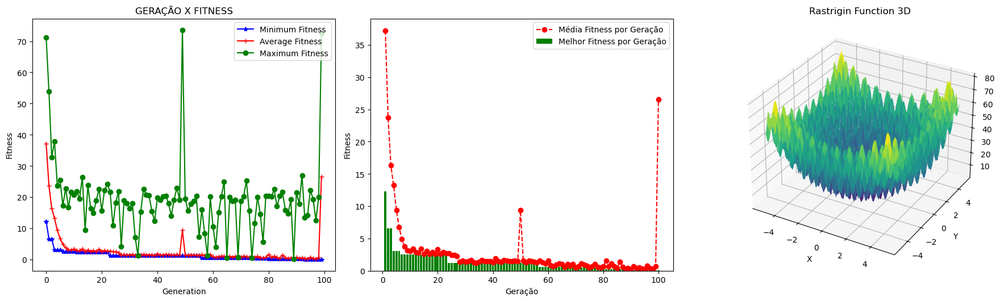

93
Soluções do problema

Best solution generation =  93

Best solution variables =
 [0.013173946682467678, -0.01420253528919566, 2.6836025478042593, 5.462484140733682, 0.4888461492834571, 2.444406634863123, -0.8088506296864348, 1.1647592234094812, -1.7162024513367742, -3.855066587125907]

Best solution fitness =  0.07440361204801249


,Generation,Min Fitness,Average Fitness,Max Fitness,Std Fitness
0,0,12.277210,37.222281,71.256778,15.833111
1,1,6.574602,23.724853,53.832744,9.613483
2,2,6.574602,16.323175,32.852788,5.050845
3,3,3.036526,13.237876,37.862831,5.106808
4,4,3.036526,9.405771,23.743914,4.000265
...,...,...,...,...,...
95,95,0.074404,0.769081,22.262482,3.484398
96,96,0.074404,0.406109,19.361298,2.303874
97,97,0.074404,0.203721,12.619552,1.247853
98,98,0.074404,0.637982,19.958981,3.032912


{'Resultado': 13, 'Best Fitness Value': np.float64(0.07440361204801249), 'Media Fitness': np.float64(26.566679924530078), 'Desvio Padrão': np.float64(19.906778488702976), 'Variaveis Decisão': [[0.013, -0.014, 2.684, 5.462, 0.489, 2.444, -0.809, 1.165, -1.716, -3.855]], 'Solution Generation': 93, 'Crossover': 0.6, 'Mutação do Individuo': 0.15, 'Percentual apply rce': 30, 'Num Var Diferença': 1, 'Delta': 0.5, 'RCE Num Generations': 50, 'otimização': 'rastrigin'}


,Resultado,Best Fitness Value,Media Fitness,Desvio Padrão,Variaveis Decisão,Solution Generation,Crossover,Mutação do Individuo,Percentual apply rce,Num Var Diferença,Delta,RCE Num Generations,otimização
0,13,0.074404,26.56668,19.906778,"[0.013, -0.014, 2.684, 5.462, 0.489, 2.444, -0...",93,0.6,0.15,30,1,0.5,50,rastrigin


Arquivo criado ! /home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/assets/output/results/resultado_RCE_13.xlsx
Método escolhido: Minimizar


/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Fitness' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.





	 RCE being applied! - Generation = 50 

Elitismo HOF Index[0] [-0.024326821423920175, -0.014571964606222898, -0.6061234698071307, 0.2536150421437098, -2.687630625586838, 2.7234461582491294, 1.7952902916779854, 2.735398145041561, -0.05636591311665473, -1.017591618505949] 
 Fitness = (0.1592777716328566,) | Diversidade = 3.10113922406567

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 4.938

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  69
Tamanho Elite =  68

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,50,0,"[-0.024326821423920175, -0.014571964606222898,...",0.159278,HOF,3.101139
1,50,1,"[-0.024326821423920175, -0.014571964606222898,...",0.159278,SIM,4.239147
2,50,2,"[-0.024326821423920175, -0.014571964606222898,...",0.159278,SIM,1.786898
3,50,3,"[-0.024326821423920175, -0.014571964606222898,...",0.159278,SIM,-5.053554
4,50,4,"[-0.024326821423920175, -0.014571964606222898,...",0.159278,SIM,-3.739312
5,50,5,"[-0.024326821423920175, -0.014571964606222898,...",0.159278,SIM,3.478032
6,50,6,"[-0.024326821423920175, -0.014571964606222898,...",0.159278,SIM,-5.058121
7,50,7,"[-0.024326821423920175, -0.014571964606222898,...",0.159278,SIM,3.251595
8,50,8,"[-0.024326821423920175, -0.014571964606222898,...",0.159278,SIM,4.213669
9,50,9,"[-0.024326821423920175, -0.014571964606222898,...",0.159278,SIM,-3.517763




	 RCE being applied! - Generation = 100 

Elitismo HOF Index[4] [-0.010683646739261664, 0.012464100989962066, -3.1631390232180907, 0.2536150421437098, -2.687630625586838, 1.6650884863957987, 1.3402069201946563, 5.351977619049386, -0.05636591311665473, -0.6085982631984963] 
 Fitness = (0.05344137256819437,) | Diversidade = 2.0969346969141713

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 1.657

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  38
Tamanho Elite =  37

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,100,0,"[-0.010683646739261664, 0.012464100989962066, ...",0.053441,HOF,2.096935
1,100,1,"[-0.010683646739261664, 0.012464100989962066, ...",0.053441,SIM,3.545241
2,100,2,"[-0.010683646739261664, 0.012464100989962066, ...",0.053441,SIM,2.930716
3,100,3,"[-0.010683646739261664, 0.012464100989962066, ...",0.053441,SIM,-4.297905
4,100,4,"[-0.010683646739261664, 0.012464100989962066, ...",0.053441,SIM,-1.812230
5,100,5,"[-0.010683646739261664, 0.012464100989962066, ...",0.053441,SIM,0.863763
6,100,6,"[-0.010683646739261664, 0.012464100989962066, ...",0.053441,SIM,0.828783
7,100,7,"[-0.010683646739261664, 0.012464100989962066, ...",0.053441,SIM,-0.928638
8,100,8,"[-0.010683646739261664, 0.012464100989962066, ...",0.053441,SIM,-0.522090
9,100,9,"[-0.010683646739261664, 0.012464100989962066, ...",0.053441,SIM,-0.185759




Evolução concluída  - 100%

	 VISUALIZANDO OS RESULTADOS



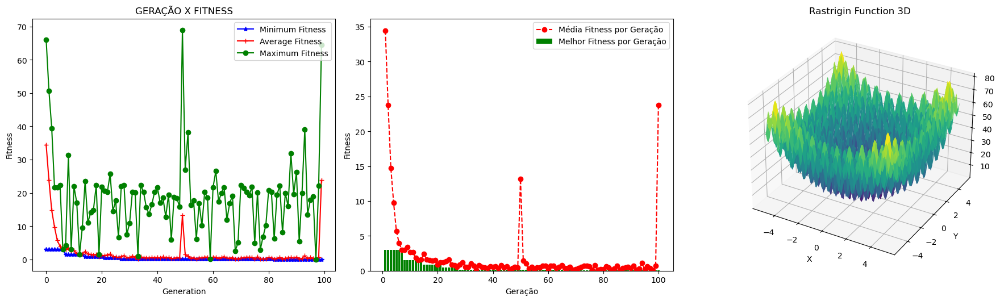

82
Soluções do problema

Best solution generation =  82

Best solution variables =
 [-0.010683646739261664, 0.012464100989962066, -3.1631390232180907, 0.2536150421437098, -2.687630625586838, 1.6650884863957987, 1.3402069201946563, 5.351977619049386, -0.05636591311665473, -0.6085982631984963]

Best solution fitness =  0.05344137256819437


,Generation,Min Fitness,Average Fitness,Max Fitness,Std Fitness
0,0,2.989381,34.463321,66.009601,13.676529
1,1,2.989381,23.783057,50.661465,10.948910
2,2,2.989381,14.746573,39.444532,6.708770
3,3,2.989381,9.754212,21.684707,5.264610
4,4,2.989381,5.696018,21.683941,3.873333
...,...,...,...,...,...
95,95,0.053441,0.621334,17.829538,2.911409
96,96,0.053441,0.360308,18.939921,2.205736
97,97,0.053441,0.053441,0.053441,0.000000
98,98,0.053441,0.704973,22.201695,3.252080


{'Resultado': 14, 'Best Fitness Value': np.float64(0.05344137256819437), 'Media Fitness': np.float64(23.78753937016215), 'Desvio Padrão': np.float64(21.762165586383947), 'Variaveis Decisão': [[-0.011, 0.012, -3.163, 0.254, -2.688, 1.665, 1.34, 5.352, -0.056, -0.609]], 'Solution Generation': 82, 'Crossover': 0.6, 'Mutação do Individuo': 0.15, 'Percentual apply rce': 30, 'Num Var Diferença': 1, 'Delta': 0.5, 'RCE Num Generations': 50, 'otimização': 'rastrigin'}


,Resultado,Best Fitness Value,Media Fitness,Desvio Padrão,Variaveis Decisão,Solution Generation,Crossover,Mutação do Individuo,Percentual apply rce,Num Var Diferença,Delta,RCE Num Generations,otimização
0,14,0.053441,23.787539,21.762166,"[-0.011, 0.012, -3.163, 0.254, -2.688, 1.665, ...",82,0.6,0.15,30,1,0.5,50,rastrigin


Arquivo criado ! /home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/assets/output/results/resultado_RCE_14.xlsx
Método escolhido: Minimizar


/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Fitness' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.





	 RCE being applied! - Generation = 50 

Elitismo HOF Index[0] [-0.9907679171207417, -0.06621363321033347, 3.0976398255373483, -0.6586542258445958, -0.3416917250737449, 2.6167605717115356, -4.658377159874335, -2.683924586793561, 3.7904993955191584, -0.49494459497158827] 
 Fitness = (1.8558293074795316,) | Diversidade = -0.38967405012085776

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 57.531

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  25
Tamanho Elite =  24

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,50,0,"[-0.9907679171207417, -0.06621363321033347, 3....",1.855829,HOF,-0.389674
1,50,1,"[-0.9907679171207417, -0.06621363321033347, 3....",1.855829,SIM,-2.093277
2,50,2,"[-0.9907679171207417, -0.06621363321033347, 3....",1.855829,SIM,1.151070
3,50,3,"[-1.9310946607217159, -0.06621363321033347, 3....",5.509174,SIM,-2.968410
4,50,4,"[-0.9907679171207417, -0.06621363321033347, 3....",1.855829,SIM,-3.154251
5,50,5,"[-0.9907679171207417, -0.06621363321033347, 3....",1.855829,SIM,1.100850
6,50,6,"[-0.9907679171207417, -0.06621363321033347, 3....",1.855829,SIM,-1.413062
7,50,7,"[-0.9907679171207417, -0.06621363321033347, 4....",1.855829,SIM,0.278449
8,50,8,"[-0.9907679171207417, -0.06621363321033347, 3....",1.855829,SIM,-1.805251
9,50,9,"[-0.9907679171207417, -1.5367065143202692, 3.4...",23.095124,SIM,-1.326198




	 RCE being applied! - Generation = 100 

Elitismo HOF Index[0] [0.009593331197265575, -0.03269354591926083, 4.482104061593327, -1.593932830684947, -0.3301248540120628, -1.4032247028935183, -4.251704792254559, -2.71378037124268, 0.908491215938561, -0.1635131095624499] 
 Fitness = (0.22956698912953222,) | Diversidade = -5.088785597840324

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 7.117

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  67
Tamanho Elite =  66

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,100,0,"[0.009593331197265575, -0.03269354591926083, 4...",0.229567,HOF,-5.088786
1,100,1,"[0.009593331197265575, -0.03269354591926083, 3...",0.229567,SIM,-3.749331
2,100,2,"[0.009593331197265575, -0.03269354591926083, 3...",0.229567,SIM,0.896504
3,100,3,"[0.009593331197265575, -0.03269354591926083, 4...",0.229567,SIM,-6.019018
4,100,4,"[0.009593331197265575, -0.03269354591926083, 4...",0.229567,SIM,-7.927889
5,100,5,"[0.009593331197265575, -0.03269354591926083, 4...",0.229567,SIM,-6.423456
6,100,6,"[0.009593331197265575, -0.03269354591926083, 4...",0.229567,SIM,-5.266984
7,100,7,"[0.009593331197265575, -0.03269354591926083, 4...",0.229567,SIM,-10.091013
8,100,8,"[0.009593331197265575, -0.03269354591926083, 4...",0.229567,SIM,-5.988795
9,100,9,"[0.009593331197265575, -0.03269354591926083, 3...",0.229567,SIM,-6.412635




Evolução concluída  - 100%

	 VISUALIZANDO OS RESULTADOS



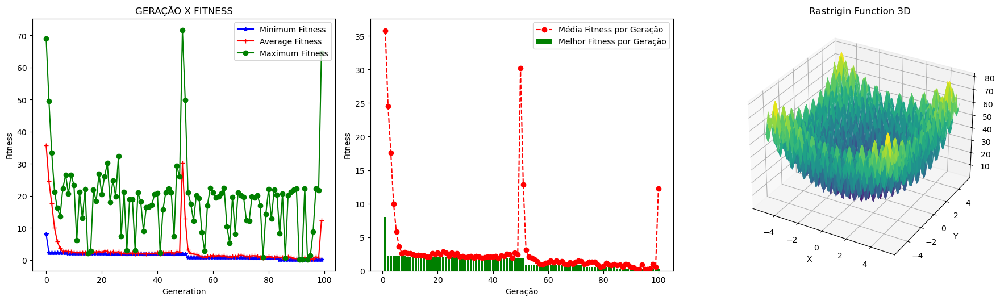

84
Soluções do problema

Best solution generation =  84

Best solution variables =
 [0.009593331197265575, -0.03269354591926083, 4.482104061593327, -1.593932830684947, -0.3301248540120628, -1.4032247028935183, -4.251704792254559, -2.71378037124268, 0.908491215938561, -0.1635131095624499]

Best solution fitness =  0.22956698912953222


,Generation,Min Fitness,Average Fitness,Max Fitness,Std Fitness
0,0,8.049062,35.812857,69.002964,14.380152
1,1,2.211113,24.508728,49.618037,9.235447
2,2,2.211113,17.621407,33.405164,7.531260
3,3,2.211113,10.002732,21.301786,5.399524
4,4,2.211113,5.784590,16.206011,3.396407
...,...,...,...,...,...
95,95,0.229567,0.240743,1.347191,0.111202
96,96,0.229567,0.323481,8.773754,0.853457
97,97,0.229567,0.991548,22.267556,3.367022
98,98,0.229567,0.610821,21.729303,2.424057


{'Resultado': 15, 'Best Fitness Value': np.float64(0.22956698912953222), 'Media Fitness': np.float64(12.281572374783392), 'Desvio Padrão': np.float64(19.212236506352962), 'Variaveis Decisão': [[0.01, -0.033, 4.482, -1.594, -0.33, -1.403, -4.252, -2.714, 0.908, -0.164]], 'Solution Generation': 84, 'Crossover': 0.6, 'Mutação do Individuo': 0.15, 'Percentual apply rce': 30, 'Num Var Diferença': 1, 'Delta': 0.5, 'RCE Num Generations': 50, 'otimização': 'rastrigin'}


,Resultado,Best Fitness Value,Media Fitness,Desvio Padrão,Variaveis Decisão,Solution Generation,Crossover,Mutação do Individuo,Percentual apply rce,Num Var Diferença,Delta,RCE Num Generations,otimização
0,15,0.229567,12.281572,19.212237,"[0.01, -0.033, 4.482, -1.594, -0.33, -1.403, -...",84,0.6,0.15,30,1,0.5,50,rastrigin


Arquivo criado ! /home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/assets/output/results/resultado_RCE_15.xlsx
Método escolhido: Minimizar


/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Fitness' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.





	 RCE being applied! - Generation = 50 

Elitismo HOF Index[0] [-0.004073351344520144, 0.0009498702274726659, -3.121564864185435, 5.592709785446413, -3.5131943782229316, 1.691373467473925, -5.247033551325539, -1.4371688973628296, 5.908857845967945, 0.9508576439859512] 
 Fitness = (0.0034705800945058485,) | Diversidade = 0.8217135706604511

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 0.108

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  21
Tamanho Elite =  20

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,50,0,"[-0.004073351344520144, 0.0009498702274726659,...",0.003471,HOF,0.821714
1,50,1,"[-0.004073351344520144, 0.0009498702274726659,...",0.003471,SIM,-0.394742
2,50,2,"[0.008868831621811069, 0.0009498702274726659, ...",0.015780,SIM,1.965730
3,50,3,"[-0.004073351344520144, 0.0009498702274726659,...",0.003471,SIM,2.163688
4,50,4,"[0.008868831621811069, 0.0009498702274726659, ...",0.015780,SIM,0.781578
5,50,5,"[-0.004073351344520144, 0.0009498702274726659,...",0.003471,SIM,1.826842
6,50,6,"[0.008868831621811069, 0.0009498702274726659, ...",0.015780,SIM,3.162580
7,50,7,"[0.008868831621811069, 0.0009498702274726659, ...",0.015780,SIM,3.080154
8,50,8,"[0.008868831621811069, 0.0009498702274726659, ...",0.015780,SIM,0.643130
9,50,9,"[0.008868831621811069, 0.0009498702274726659, ...",0.015780,SIM,2.724130




	 RCE being applied! - Generation = 100 

Elitismo HOF Index[18] [-0.00044530080593961196, 0.0009498702274726659, -3.121564864185435, 5.592709785446413, -2.2322288761367997, 1.691373467473925, -5.247033551325539, -1.4371688973628296, -4.0177832459521765, -3.7402101482907018] 
 Fitness = (0.00021833911567092912,) | Diversidade = -12.51140176091161

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 0.007

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  73
Tamanho Elite =  72

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,100,0,"[-0.00044530080593961196, 0.000949870227472665...",0.000218,HOF,-12.511402
1,100,1,"[-0.00044530080593961196, 0.000949870227472665...",0.000218,SIM,-10.281823
2,100,2,"[-0.00044530080593961196, 0.000949870227472665...",0.000218,SIM,-11.177809
3,100,3,"[-0.00044530080593961196, 0.000949870227472665...",0.000218,SIM,-10.484190
4,100,4,"[-0.00044530080593961196, 0.000949870227472665...",0.000218,SIM,-11.835980
5,100,5,"[-0.00044530080593961196, 0.000949870227472665...",0.000218,SIM,-12.509578
6,100,6,"[-0.00044530080593961196, 0.000949870227472665...",0.000218,SIM,-11.964968
7,100,7,"[-0.00044530080593961196, 0.000949870227472665...",0.000218,SIM,-10.132910
8,100,8,"[-0.00044530080593961196, 0.000949870227472665...",0.000218,SIM,-5.622388
9,100,9,"[-0.00044530080593961196, 0.000949870227472665...",0.000218,SIM,-10.873264




Evolução concluída  - 100%

	 VISUALIZANDO OS RESULTADOS



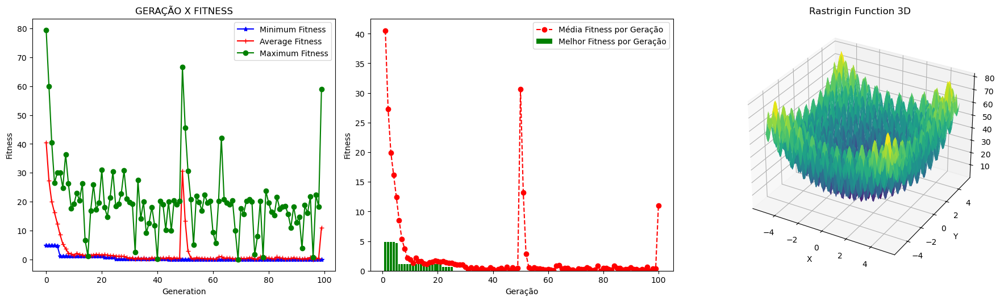

59
Soluções do problema

Best solution generation =  59

Best solution variables =
 [-0.00044530080593961196, 0.0009498702274726659, -3.121564864185435, 5.592709785446413, -2.2322288761367997, 1.691373467473925, -5.247033551325539, -1.4371688973628296, -4.0177832459521765, -3.7402101482907018]

Best solution fitness =  0.00021833911567092912


,Generation,Min Fitness,Average Fitness,Max Fitness,Std Fitness
0,0,4.846967,40.533920,79.484824,16.075184
1,1,4.846967,27.274132,60.017000,9.944622
2,2,4.846967,19.946662,40.390659,5.899992
3,3,4.846967,16.164801,26.417902,4.961180
4,4,4.660462,12.403317,30.034516,5.967745
...,...,...,...,...,...
95,95,0.000218,0.605244,21.734607,3.324851
96,96,0.000218,0.006385,0.616887,0.061358
97,97,0.000218,0.398531,22.335160,2.809101
98,98,0.000218,0.325407,18.188828,2.133965


{'Resultado': 16, 'Best Fitness Value': np.float64(0.00021833911567092912), 'Media Fitness': np.float64(10.991404649173877), 'Desvio Padrão': np.float64(19.31671396377072), 'Variaveis Decisão': [[-0.0, 0.001, -3.122, 5.593, -2.232, 1.691, -5.247, -1.437, -4.018, -3.74]], 'Solution Generation': 59, 'Crossover': 0.6, 'Mutação do Individuo': 0.15, 'Percentual apply rce': 30, 'Num Var Diferença': 1, 'Delta': 0.5, 'RCE Num Generations': 50, 'otimização': 'rastrigin'}


,Resultado,Best Fitness Value,Media Fitness,Desvio Padrão,Variaveis Decisão,Solution Generation,Crossover,Mutação do Individuo,Percentual apply rce,Num Var Diferença,Delta,RCE Num Generations,otimização
0,16,0.000218,10.991405,19.316714,"[-0.0, 0.001, -3.122, 5.593, -2.232, 1.691, -5...",59,0.6,0.15,30,1,0.5,50,rastrigin


Arquivo criado ! /home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/assets/output/results/resultado_RCE_16.xlsx
Método escolhido: Minimizar


/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Fitness' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.





	 RCE being applied! - Generation = 50 

Elitismo HOF Index[0] [0.016026078828607737, -0.05754933197197132, -4.818177398643055, -0.010947406357050937, 2.7506965408761195, 0.6775426988283577, -3.491443308751516, 4.454707006232812, 0.9448474802129487, -0.18712799280469294] 
 Fitness = (0.7008789538526514,) | Diversidade = 0.2785743664505589

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 21.727

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  71
Tamanho Elite =  70

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,50,0,"[0.016026078828607737, -0.05754933197197132, -...",0.700879,HOF,0.278574
1,50,1,"[0.016026078828607737, -0.05754933197197132, -...",0.700879,SIM,-2.318641
2,50,2,"[-0.7981321697161252, -0.05754933197197132, -5...",8.308638,SIM,-0.297139
3,50,3,"[0.016026078828607737, -0.05754933197197132, -...",0.700879,SIM,2.142638
4,50,4,"[0.016026078828607737, -0.05754933197197132, -...",0.700879,SIM,-0.499395
5,50,5,"[0.016026078828607737, -0.05754933197197132, -...",0.700879,SIM,11.059005
6,50,6,"[0.016026078828607737, -0.05754933197197132, -...",0.700879,SIM,0.043186
7,50,7,"[0.016026078828607737, -0.05754933197197132, -...",0.700879,SIM,11.504032
8,50,8,"[0.016026078828607737, -0.05754933197197132, -...",0.700879,SIM,-2.322458
9,50,9,"[0.016026078828607737, -0.05754933197197132, -...",0.700879,SIM,-1.624895




	 RCE being applied! - Generation = 100 

Elitismo HOF Index[64] [0.010998064962426123, 0.010517284970691584, -5.2500952608827065, -0.5173716128774442, 4.014175014073525, 1.7936520148021562, -3.491443308751516, 3.3560520608224604, 1.7568785386619323, -0.18712799280469294] 
 Fitness = (0.04592435393804273,) | Diversidade = 1.4962348029768322

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 1.424

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  38
Tamanho Elite =  37

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,100,0,"[0.010998064962426123, 0.010517284970691584, -...",0.045924,HOF,1.496235
1,100,1,"[0.010998064962426123, 0.010517284970691584, -...",0.045924,SIM,-0.168351
2,100,2,"[0.010998064962426123, 0.010517284970691584, -...",0.045924,SIM,2.715341
3,100,3,"[0.010998064962426123, 0.010517284970691584, -...",0.045924,SIM,3.517924
4,100,4,"[0.010998064962426123, 0.010517284970691584, -...",0.045924,SIM,12.019263
5,100,5,"[0.010998064962426123, 0.010517284970691584, -...",0.045924,SIM,11.916334
6,100,6,"[0.010998064962426123, 0.010517284970691584, -...",0.045924,SIM,1.937278
7,100,7,"[0.010998064962426123, 0.010517284970691584, -...",0.045924,SIM,12.348524
8,100,8,"[0.010998064962426123, 0.010517284970691584, -...",0.045924,SIM,-0.067581
9,100,9,"[0.010998064962426123, 0.010517284970691584, -...",0.045924,SIM,9.930382




Evolução concluída  - 100%

	 VISUALIZANDO OS RESULTADOS



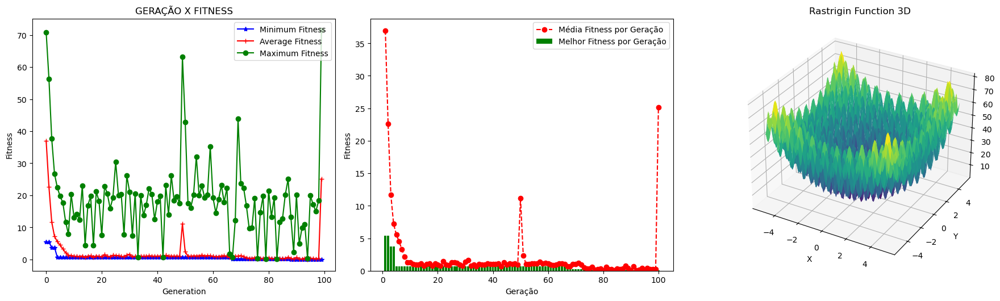

88
Soluções do problema

Best solution generation =  88

Best solution variables =
 [0.010998064962426123, 0.010517284970691584, -5.2500952608827065, -0.5173716128774442, 4.014175014073525, 1.7936520148021562, -3.491443308751516, 3.3560520608224604, 1.7568785386619323, -0.18712799280469294]

Best solution fitness =  0.04592435393804273


,Generation,Min Fitness,Average Fitness,Max Fitness,Std Fitness
0,0,5.385279,36.969921,70.857822,15.506958
1,1,5.385279,22.588412,56.342137,11.979436
2,2,3.743155,11.664747,37.609790,7.097427
3,3,3.743155,7.188655,26.726629,3.481214
4,4,0.700879,5.547869,22.428633,2.433041
...,...,...,...,...,...
95,95,0.045924,0.395872,19.929930,2.472779
96,96,0.045924,0.272528,17.092210,1.780334
97,97,0.045924,0.195774,15.030869,1.490983
98,98,0.045924,0.264179,18.331072,1.849641


{'Resultado': 17, 'Best Fitness Value': np.float64(0.04592435393804273), 'Media Fitness': np.float64(25.14447952015983), 'Desvio Padrão': np.float64(22.44075217877741), 'Variaveis Decisão': [[0.011, 0.011, -5.25, -0.517, 4.014, 1.794, -3.491, 3.356, 1.757, -0.187]], 'Solution Generation': 88, 'Crossover': 0.6, 'Mutação do Individuo': 0.15, 'Percentual apply rce': 30, 'Num Var Diferença': 1, 'Delta': 0.5, 'RCE Num Generations': 50, 'otimização': 'rastrigin'}


,Resultado,Best Fitness Value,Media Fitness,Desvio Padrão,Variaveis Decisão,Solution Generation,Crossover,Mutação do Individuo,Percentual apply rce,Num Var Diferença,Delta,RCE Num Generations,otimização
0,17,0.045924,25.14448,22.440752,"[0.011, 0.011, -5.25, -0.517, 4.014, 1.794, -3...",88,0.6,0.15,30,1,0.5,50,rastrigin


Arquivo criado ! /home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/assets/output/results/resultado_RCE_17.xlsx
Método escolhido: Minimizar


/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Fitness' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.





	 RCE being applied! - Generation = 50 

Elitismo HOF Index[0] [-0.00688376214562858, -0.006767344445032245, 3.493686571824428, 1.7585075244542239, 0.6866266887020388, -1.4858005193518649, 0.5294361420844931, 0.8246834048696146, -4.8673257188698065, -3.9249114257074096] 
 Fitness = (0.01848397612670105,) | Diversidade = -2.9987484385849434

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 0.573

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  62
Tamanho Elite =  61

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,50,0,"[-0.00688376214562858, -0.006767344445032245, ...",0.018484,HOF,-2.998748
1,50,1,"[-0.00688376214562858, -0.006767344445032245, ...",0.018484,SIM,-0.758823
2,50,2,"[-0.00688376214562858, -0.006767344445032245, ...",0.018484,SIM,-7.150294
3,50,3,"[-0.00688376214562858, -0.006767344445032245, ...",0.018484,SIM,-3.263581
4,50,4,"[-0.00688376214562858, -0.006767344445032245, ...",0.018484,SIM,-6.828545
5,50,5,"[-0.00688376214562858, -0.006767344445032245, ...",0.018484,SIM,-5.752572
6,50,6,"[-0.00688376214562858, -0.006767344445032245, ...",0.018484,SIM,-7.738042
7,50,7,"[-0.00688376214562858, -0.006767344445032245, ...",0.018484,SIM,-7.149452
8,50,8,"[-0.00688376214562858, -0.006767344445032245, ...",0.018484,SIM,-1.137434
9,50,9,"[-0.00688376214562858, -0.006767344445032245, ...",0.018484,SIM,-1.488029




	 RCE being applied! - Generation = 100 

Elitismo HOF Index[0] [-0.00688376214562858, -0.006767344445032245, 3.493686571824428, 1.7585075244542239, 0.6866266887020388, -1.4858005193518649, 0.5294361420844931, 0.8246834048696146, -4.8673257188698065, -3.9249114257074096] 
 Fitness = (0.01848397612670105,) | Diversidade = -2.9987484385849434

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 0.573

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  69
Tamanho Elite =  68

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,100,0,"[-0.00688376214562858, -0.006767344445032245, ...",0.018484,HOF,-2.998748
1,100,1,"[-0.00688376214562858, -0.006767344445032245, ...",0.018484,SIM,-3.015796
2,100,2,"[-0.00688376214562858, -0.006767344445032245, ...",0.018484,SIM,-4.326209
3,100,3,"[-0.00688376214562858, -0.006767344445032245, ...",0.018484,SIM,-6.632248
4,100,4,"[-0.00688376214562858, -0.006767344445032245, ...",0.018484,SIM,-4.188828
5,100,5,"[-0.00688376214562858, -0.006767344445032245, ...",0.018484,SIM,-4.136696
6,100,6,"[-0.00688376214562858, -0.006767344445032245, ...",0.018484,SIM,-3.575808
7,100,7,"[-0.00688376214562858, -0.006767344445032245, ...",0.018484,SIM,-5.964402
8,100,8,"[-0.00688376214562858, -0.006767344445032245, ...",0.018484,SIM,-3.966619
9,100,9,"[-0.00688376214562858, -0.006767344445032245, ...",0.018484,SIM,-4.233418




Evolução concluída  - 100%

	 VISUALIZANDO OS RESULTADOS



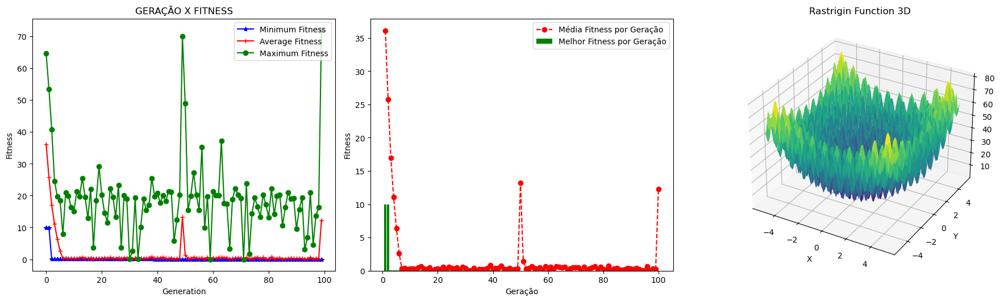

39
Soluções do problema

Best solution generation =  39

Best solution variables =
 [-0.00688376214562858, -0.006767344445032245, 3.493686571824428, 1.7585075244542239, 0.6866266887020388, -1.4858005193518649, 0.5294361420844931, 0.8246834048696146, -4.8673257188698065, -3.9249114257074096]

Best solution fitness =  0.01848397612670105


,Generation,Min Fitness,Average Fitness,Max Fitness,Std Fitness
0,0,9.988726,36.105966,64.534866,13.828993
1,1,9.988726,25.781295,53.388764,10.523596
2,2,0.026037,16.962433,40.718729,7.163519
3,3,0.026037,11.077482,24.547050,5.674500
4,4,0.026037,6.415481,19.726687,4.934914
...,...,...,...,...,...
95,95,0.018484,0.647052,21.011514,3.046233
96,96,0.018484,0.064068,4.576926,0.453559
97,97,0.018484,0.348441,13.663300,1.979887
98,98,0.018484,0.195760,16.380184,1.632263


{'Resultado': 18, 'Best Fitness Value': np.float64(0.01848397612670105), 'Media Fitness': np.float64(12.29959550884518), 'Desvio Padrão': np.float64(19.947854965501243), 'Variaveis Decisão': [[-0.007, -0.007, 3.494, 1.759, 0.687, -1.486, 0.529, 0.825, -4.867, -3.925]], 'Solution Generation': 39, 'Crossover': 0.6, 'Mutação do Individuo': 0.15, 'Percentual apply rce': 30, 'Num Var Diferença': 1, 'Delta': 0.5, 'RCE Num Generations': 50, 'otimização': 'rastrigin'}


,Resultado,Best Fitness Value,Media Fitness,Desvio Padrão,Variaveis Decisão,Solution Generation,Crossover,Mutação do Individuo,Percentual apply rce,Num Var Diferença,Delta,RCE Num Generations,otimização
0,18,0.018484,12.299596,19.947855,"[-0.007, -0.007, 3.494, 1.759, 0.687, -1.486, ...",39,0.6,0.15,30,1,0.5,50,rastrigin


Arquivo criado ! /home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/assets/output/results/resultado_RCE_18.xlsx
Método escolhido: Minimizar


/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Fitness' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.





	 RCE being applied! - Generation = 50 

Elitismo HOF Index[0] [0.021755260232087584, 0.030898141785833166, 1.4421267765216228, 2.507479189675143, -4.054458494612773, 1.754084186469528, -2.2776594140465263, -4.354967662751603, 3.2243055711841757, 0.03133572597304379] 
 Fitness = (0.2825647070051236,) | Diversidade = -1.6751007195694685

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 8.76

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  58
Tamanho Elite =  57

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,50,0,"[0.021755260232087584, 0.030898141785833166, 1...",0.282565,HOF,-1.675101
1,50,1,"[0.021755260232087584, 0.030898141785833166, 0...",0.282565,SIM,3.400604
2,50,2,"[0.021755260232087584, 0.030898141785833166, 1...",0.282565,SIM,-4.213515
3,50,3,"[0.021755260232087584, 0.030898141785833166, 1...",0.282565,SIM,-4.074153
4,50,4,"[0.021755260232087584, 0.030898141785833166, 1...",0.282565,SIM,1.581270
5,50,5,"[0.021755260232087584, 0.030898141785833166, 1...",0.282565,SIM,3.325602
6,50,6,"[0.021755260232087584, 0.030898141785833166, 1...",0.282565,SIM,-4.292354
7,50,7,"[0.021755260232087584, 0.030898141785833166, 1...",0.282565,SIM,3.040070
8,50,8,"[0.021755260232087584, 0.030898141785833166, 1...",0.282565,SIM,4.425309
9,50,9,"[0.021755260232087584, 0.030898141785833166, 1...",0.282565,SIM,0.808990




	 RCE being applied! - Generation = 100 

Elitismo HOF Index[7] [0.01114929931159417, 0.0032457076704357907, 0.29280656314771614, 2.507479189675143, -3.329380568131751, 2.7722263164876804, -2.2776594140465263, -4.354967662751603, 1.66068402764335, -0.6353769812600361] 
 Fitness = (0.026741380441091422,) | Diversidade = -3.349793522253997

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 0.829

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  73
Tamanho Elite =  72

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,100,0,"[0.01114929931159417, 0.0032457076704357907, 0...",0.026741,HOF,-3.349794
1,100,1,"[0.01114929931159417, 0.0032457076704357907, 0...",0.026741,SIM,-2.740432
2,100,2,"[0.01114929931159417, 0.0032457076704357907, 0...",0.026741,SIM,0.427956
3,100,3,"[0.01114929931159417, 0.0032457076704357907, 0...",0.026741,SIM,-5.093014
4,100,4,"[0.01114929931159417, 0.0032457076704357907, 0...",0.026741,SIM,-3.529392
5,100,5,"[0.01114929931159417, 0.0032457076704357907, 0...",0.026741,SIM,-0.946979
6,100,6,"[0.01114929931159417, 0.0032457076704357907, -...",0.026741,SIM,-6.213087
7,100,7,"[0.01114929931159417, 0.0032457076704357907, 0...",0.026741,SIM,-2.594089
8,100,8,"[0.01114929931159417, 0.0032457076704357907, 0...",0.026741,SIM,-0.381371
9,100,9,"[0.01114929931159417, 0.0032457076704357907, 0...",0.026741,SIM,-3.688701




Evolução concluída  - 100%

	 VISUALIZANDO OS RESULTADOS



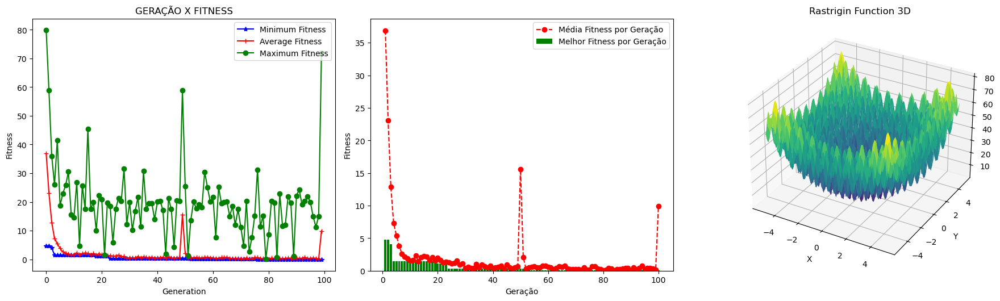

76
Soluções do problema

Best solution generation =  76

Best solution variables =
 [0.01114929931159417, 0.0032457076704357907, 0.29280656314771614, 2.507479189675143, -3.329380568131751, 2.7722263164876804, -2.2776594140465263, -4.354967662751603, 1.66068402764335, -0.6353769812600361]

Best solution fitness =  0.026741380441091422


,Generation,Min Fitness,Average Fitness,Max Fitness,Std Fitness
0,0,4.744082,36.872121,79.901728,15.433662
1,1,4.744082,23.094933,58.825375,12.406109
2,2,4.110408,12.881590,35.941560,7.825353
3,3,1.418711,7.304228,26.044863,3.759358
4,4,1.418711,5.421605,41.507027,4.890491
...,...,...,...,...,...
95,95,0.026741,0.385103,20.006371,2.525416
96,96,0.026741,0.444602,14.979881,2.363195
97,97,0.026741,0.347214,11.303445,1.533557
98,98,0.026741,0.176658,15.018386,1.491650


{'Resultado': 19, 'Best Fitness Value': np.float64(0.026741380441091422), 'Media Fitness': np.float64(9.916431648424437), 'Desvio Padrão': np.float64(18.153541359629024), 'Variaveis Decisão': [[0.011, 0.003, 0.293, 2.507, -3.329, 2.772, -2.278, -4.355, 1.661, -0.635]], 'Solution Generation': 76, 'Crossover': 0.6, 'Mutação do Individuo': 0.15, 'Percentual apply rce': 30, 'Num Var Diferença': 1, 'Delta': 0.5, 'RCE Num Generations': 50, 'otimização': 'rastrigin'}


,Resultado,Best Fitness Value,Media Fitness,Desvio Padrão,Variaveis Decisão,Solution Generation,Crossover,Mutação do Individuo,Percentual apply rce,Num Var Diferença,Delta,RCE Num Generations,otimização
0,19,0.026741,9.916432,18.153541,"[0.011, 0.003, 0.293, 2.507, -3.329, 2.772, -2...",76,0.6,0.15,30,1,0.5,50,rastrigin


Arquivo criado ! /home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/assets/output/results/resultado_RCE_19.xlsx
Método escolhido: Minimizar


/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Fitness' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/home/pedrov/.local/lib/python3.12/site-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.





	 RCE being applied! - Generation = 50 

Elitismo HOF Index[0] [0.04987362147146979, 0.03519488269272242, 0.08225344922098987, -1.3999298326000833, 3.4205051948838365, -2.5988605514189262, -3.9981669161824094, -1.5727952003586654, -1.055541020675312, 0.7892712119814327] 
 Fitness = (0.7342209395313386,) | Diversidade = -6.248195160984945

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 22.761

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  57
Tamanho Elite =  56

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,50,0,"[0.04987362147146979, 0.03519488269272242, 0.0...",0.734221,HOF,-6.248195
1,50,1,"[0.04987362147146979, 0.03519488269272242, 1.4...",0.734221,SIM,-4.894923
2,50,2,"[0.04987362147146979, 0.03519488269272242, 1.4...",0.734221,SIM,2.619301
3,50,3,"[0.04987362147146979, 0.03519488269272242, 0.0...",0.734221,SIM,-0.345387
4,50,4,"[0.04987362147146979, 0.03519488269272242, 0.0...",0.734221,SIM,-3.098867
5,50,5,"[0.04987362147146979, 0.03519488269272242, 0.0...",0.734221,SIM,-1.758382
6,50,6,"[0.04987362147146979, 0.03519488269272242, 0.0...",0.734221,SIM,-3.066167
7,50,7,"[0.04987362147146979, 0.03519488269272242, 1.0...",0.734221,SIM,-0.975798
8,50,8,"[0.04987362147146979, 0.03519488269272242, -1....",0.734221,SIM,-7.724911
9,50,9,"[0.04987362147146979, 0.03519488269272242, 0.0...",0.734221,SIM,-1.911425




	 RCE being applied! - Generation = 100 

Elitismo HOF Index[7] [0.009841162734211546, 0.004204157111414208, 1.034302176696944, 1.7820987133232746, 3.4205051948838365, -3.07575690659612, -3.9981669161824094, -1.5727952003586654, -1.055541020675312, 1.143359933032381] 
 Fitness = (0.022714247449311387,) | Diversidade = -2.307948706030445

	 Criterio 1 - Pegando o valor máximo de Fitness para selecionar individuos

Fitness (3000)% = 0.704

	 New - CRITÉRIO 2 RCE 


Tamanho Elite =  41
Tamanho Elite =  40

	 CRITERIO 3 - População aleatória modificada [HOF,RCE,Aleatorio] 

Individuos da nova população aleatória


,Generations,index,Variaveis de Decisão,Fitness,RCE,Diversidade
0,100,0,"[0.009841162734211546, 0.004204157111414208, 1...",0.022714,HOF,-2.307949
1,100,1,"[0.009841162734211546, 0.004204157111414208, 1...",0.022714,SIM,-4.396476
2,100,2,"[0.009841162734211546, 0.004204157111414208, 2...",0.022714,SIM,-0.242414
3,100,3,"[0.009841162734211546, 0.004204157111414208, 0...",0.022714,SIM,-4.228452
4,100,4,"[0.009841162734211546, 0.004204157111414208, 2...",0.022714,SIM,-2.088704
5,100,5,"[0.009841162734211546, 0.004204157111414208, 0...",0.022714,SIM,-4.195751
6,100,6,"[0.009841162734211546, 0.004204157111414208, 2...",0.022714,SIM,-2.350507
7,100,7,"[0.009841162734211546, 0.004204157111414208, 2...",0.022714,SIM,-2.607130
8,100,8,"[0.009841162734211546, 0.004204157111414208, 2...",0.022714,SIM,-2.567183
9,100,9,"[0.009841162734211546, 0.004204157111414208, 1...",0.022714,SIM,-1.390876




Evolução concluída  - 100%

	 VISUALIZANDO OS RESULTADOS



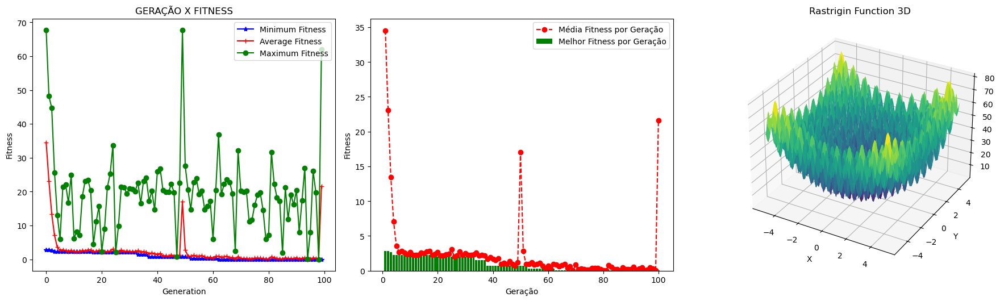

62
Soluções do problema

Best solution generation =  62

Best solution variables =
 [0.009841162734211546, 0.004204157111414208, 1.034302176696944, 1.7820987133232746, 3.4205051948838365, -3.07575690659612, -3.9981669161824094, -1.5727952003586654, -1.055541020675312, 1.143359933032381]

Best solution fitness =  0.022714247449311387


,Generation,Min Fitness,Average Fitness,Max Fitness,Std Fitness
0,0,2.864421,34.535894,67.738819,13.459989
1,1,2.864421,23.045051,48.196867,10.932794
2,2,2.679944,13.431694,44.671226,9.144120
3,3,2.225828,7.092712,25.676641,5.136411
4,4,2.225828,3.563298,13.047572,1.862387
...,...,...,...,...,...
95,95,0.022714,0.103602,8.056055,0.799271
96,96,0.022714,0.432042,26.063092,2.822787
97,97,0.022714,0.344618,19.689335,2.309238
98,98,0.022714,0.022714,0.022714,0.000000


{'Resultado': 20, 'Best Fitness Value': np.float64(0.022714247449311387), 'Media Fitness': np.float64(21.644824066250024), 'Desvio Padrão': np.float64(20.80769550751715), 'Variaveis Decisão': [[0.01, 0.004, 1.034, 1.782, 3.421, -3.076, -3.998, -1.573, -1.056, 1.143]], 'Solution Generation': 62, 'Crossover': 0.6, 'Mutação do Individuo': 0.15, 'Percentual apply rce': 30, 'Num Var Diferença': 1, 'Delta': 0.5, 'RCE Num Generations': 50, 'otimização': 'rastrigin'}


,Resultado,Best Fitness Value,Media Fitness,Desvio Padrão,Variaveis Decisão,Solution Generation,Crossover,Mutação do Individuo,Percentual apply rce,Num Var Diferença,Delta,RCE Num Generations,otimização
0,20,0.022714,21.644824,20.807696,"[0.01, 0.004, 1.034, 1.782, 3.421, -3.076, -3....",62,0.6,0.15,30,1,0.5,50,rastrigin


Arquivo criado ! /home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/assets/output/results/resultado_RCE_20.xlsx
Total execution time: 2.87 seconds


In [7]:
if __name__ == "__main__":
    contadorResultado = 0

    for i in range(contadorResultado, 20):

        tempo1 = time.time()

        # Setup
        params = load_params(
            r"/home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/db/parameters.json"
        )

        setup = Setup(params)
        alg = AlgoritimoEvolutivoRCE(setup)
        data_visual = DataExploration()

        pop_with_repopulation, logbook_with_repopulation, best_variables = alg.run(
            RCE=True,
            fitness_function=rastrigin_decisionVariables,
            decision_variables=(X, y),
        )

        print("\n\nEvolução concluída  - 100%")

        # Visualização dos resultados
        alg.cout("VISUALIZANDO OS RESULTADOS")
        data_visual.show_rastrigin_benchmark(logbook_with_repopulation, best_variables)
        x, y, z = data_visual.visualize(
            logbook_with_repopulation, pop_with_repopulation, repopulation=True
        )
        avg, std = data_visual.statistics_per_generation_df(logbook_with_repopulation)

        #! Gerando resultados
        var = []
        for i in y:
            var.append(round(i, 3))

        results = {
            "Resultado": contadorResultado + 1,
            "Best Fitness Value": z,
            "Media Fitness": avg[-1],
            "Desvio Padrão": std[-1],
            "Variaveis Decisão": [var],  # 3 casas decimais
            "Solution Generation": x,
            "Crossover": params["CROSSOVER"],
            "Mutação do Individuo": params["MUTACAO"],
            "Percentual apply rce": params["PORCENTAGEM"],
            "Num Var Diferença": params["NUM_VAR_DIFERENTES"],
            "Delta": params["VALOR_LIMITE"],
            "RCE Num Generations": params["RCE_REPOPULATION_GENERATIONS"],
            "otimização": params["type"],
        }
        print(results)

        results_df = pd.DataFrame(data=results)

        # dataframe to excel 20 vezes mudando nome do arquivo
        display(results_df)

        file_name = (
            f"/home/pedrov/Documentos/GitHub/Engenharia-Eletrica-UFF/Iniciação Cientifica - Eng Eletrica UFF/evolution_rce_master/src/assets/output/results/resultado_RCE_{contadorResultado + 1}.xlsx"
        )
        results_df.to_excel(
            file_name,
            index=False,
        )

        print("Arquivo criado !", file_name)
        contadorResultado = contadorResultado + 1

    tempo2 = time.time()
    print(f"Total execution time: {round(tempo2-tempo1,2)} seconds")